In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/airbnb-new-user/countries.csv
/kaggle/input/airbnb-new-user/sample_submission_NDGC_3.csv
/kaggle/input/airbnb-new-user/age_gender_bkts.csv
/kaggle/input/airbnb-new-user/train.csv
/kaggle/input/airbnb-new-user/test.csv
/kaggle/input/airbnb-new-user/sessions.csv


In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [8]:
# countries = pd.read_csv("drive/My Drive/airbnb-new-user/countries.csv")
age_gender = pd.read_csv("../input/airbnb-new-user/age_gender_bkts.csv")
test = pd.read_csv("../input/airbnb-new-user/test.csv")
# samp = pd.read_csv("drive/My Drive/airbnb-new-user/sample_submission_NDGC_3.csv")
# session = pd.read_csv("drive/My Drive/airbnb-new-user/sessions.csv")
train = pd.read_csv("../input/airbnb-new-user/train.csv")

# EDA and Preprocessing(Oulier and null value handling)

## Age, Gender, Population of Countries

First to get the ages in sorted order, we take the mean of the age ranges, so that any ages in the range are closer to the mean

Converted the age-ranges to the mean of that range of ages.

In [9]:
from functools import reduce
age_gender["age_avg"] = age_gender.age_bucket.apply(lambda x: 102 if x=="100+" else reduce(lambda a, b: (int(a)+int(b))/2, x.split("-")))
age_gender.drop(columns=["age_bucket"], inplace=True)

Group by country destination and age

In [10]:
grp_age_ctr = age_gender[["country_destination",'population_in_thousands', "age_avg"]].groupby(["country_destination", "age_avg"]).sum().reset_index(level=0).reset_index(level=0)

#### Age vs population for different countries

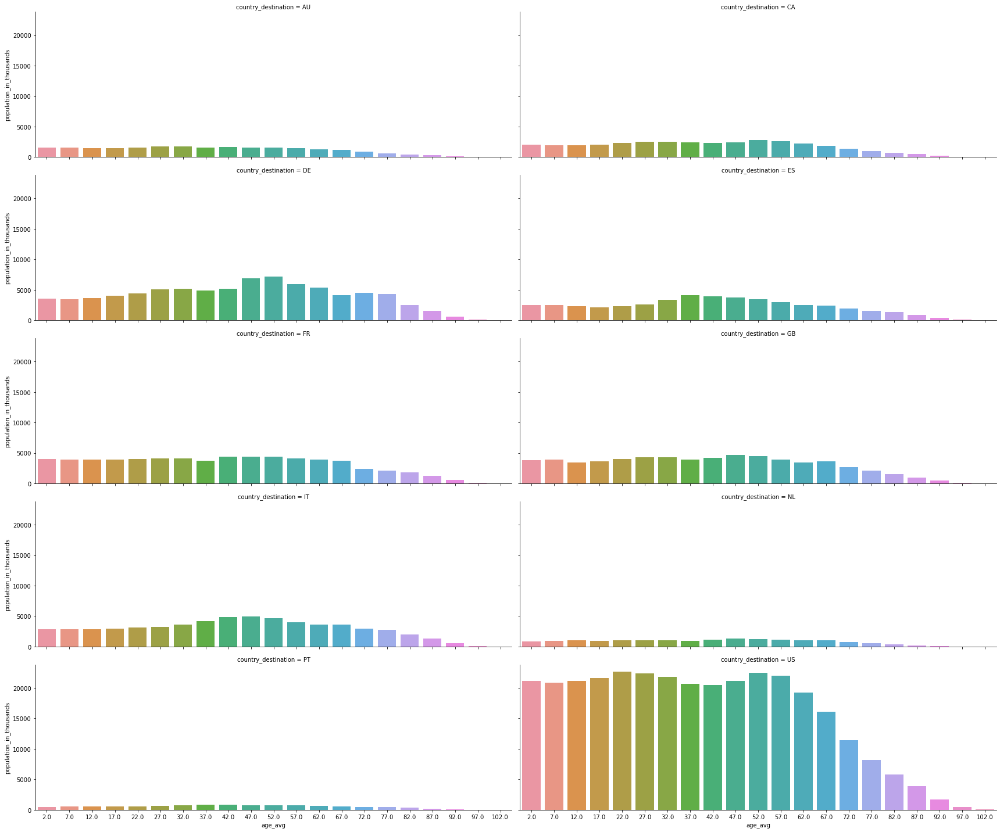

In [11]:
sns.catplot(data=grp_age_ctr, x="age_avg", y="population_in_thousands", kind="bar", col="country_destination", col_wrap=2, height=4, aspect=3)

All the countries have a similar age distribution with people in 40-50 being the majority

#### Country vs Population for different Ages

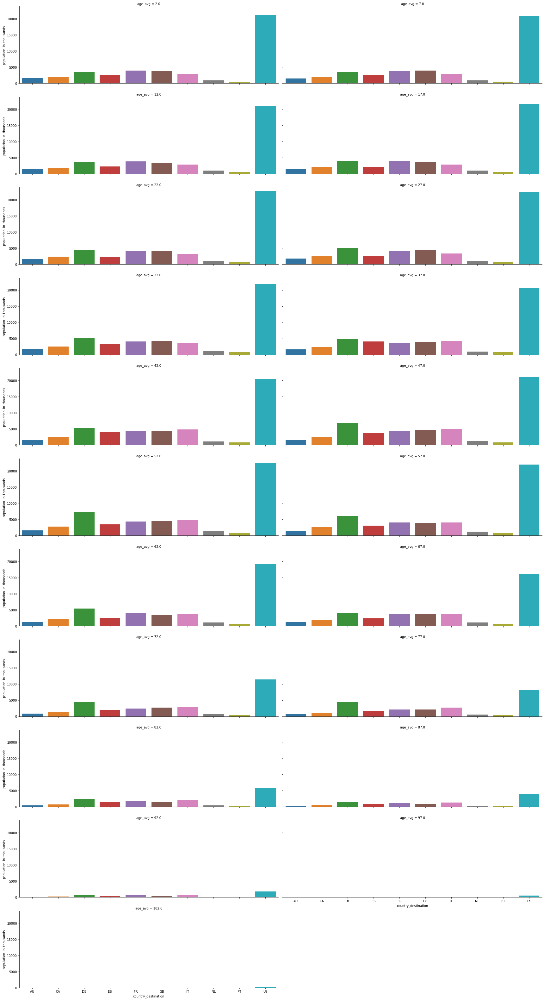

In [12]:
sns.catplot(data=grp_age_ctr, x="country_destination", y="population_in_thousands", kind="bar", col="age_avg", col_wrap=2, height=4, aspect=3)

All ages follow a similar distribution, with US being the most and Portugal being the least. People of ages 100+ are only present in the US

#### Age vs Population

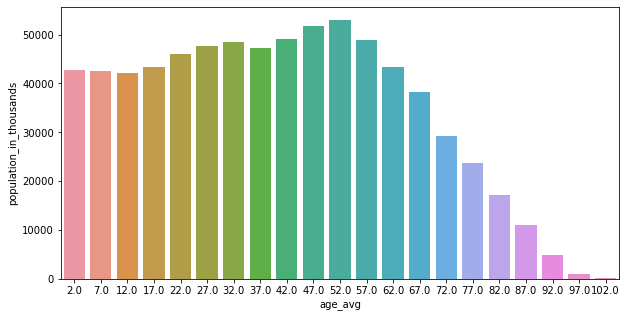

In [13]:
age_pop = age_gender.groupby("age_avg").sum().reset_index()
plt.figure(figsize=(10, 5))
sns.barplot(x="age_avg", y="population_in_thousands", data=age_pop)

People from ages 50-54 are the most and people almost steadily increase till 50-54 and go down from there rapidly.

#### Country vs population

Population in each country:

In [14]:
cr_pop = age_gender.groupby("country_destination").sum()
(cr_pop.population_in_thousands/cr_pop.population_in_thousands.sum() * 100).sort_values(ascending=False)

country_destination
US    44.409902
DE    11.277175
FR     8.876052
GB     8.719930
IT     8.351819
ES     6.447476
CA     4.899633
AU     3.267652
NL     2.301275
PT     1.449087
Name: population_in_thousands, dtype: float64

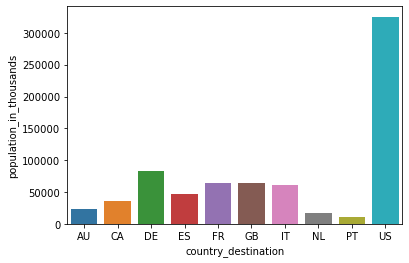

In [15]:
sns.barplot(x=cr_pop.index, y="population_in_thousands", data=cr_pop)

US has the most population, followed by Germany

#### Gender

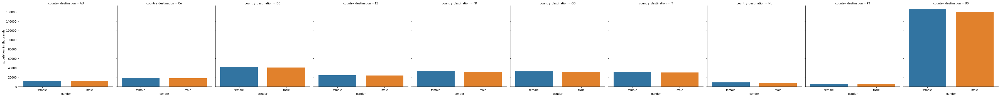

In [17]:
gender_gp = age_gender.groupby(["gender", "country_destination"]).sum().reset_index()
#print(gender_gp.sort_values(by="population_in_thousands", ascending=False))
sns.catplot(x="gender", y="population_in_thousands", data=gender_gp, kind="bar", col="country_destination")

Per country, there is no noticiable female-male difference 

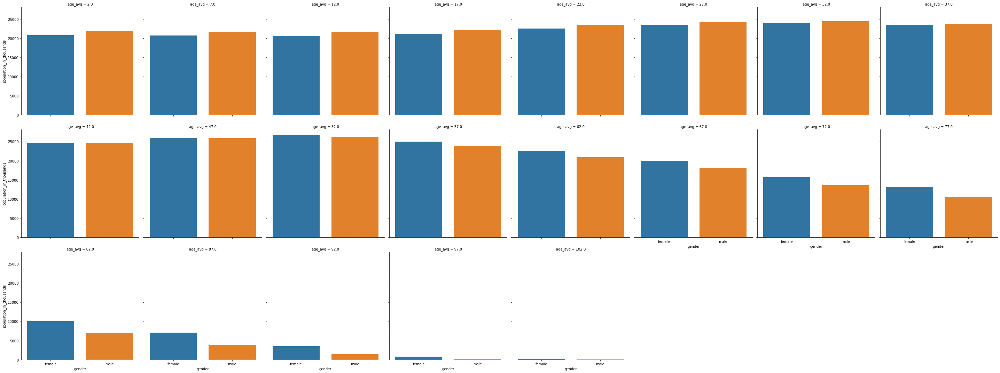

In [18]:
gender_gp = age_gender.groupby(["gender", "age_avg"]).sum().reset_index()
sns.catplot(x="gender", y="population_in_thousands", data=gender_gp, kind="bar", col="age_avg", col_wrap=8)

Till age group of 35-40, there are more men compared to women. From 40-45, there are more women compared to men. There are more younger men than women. Meaning, female life expectancy is higher than men

## Data handling

Splitting into input features and combining them for imputing and analysing. Extra column "train" is added to identify training set in the future

In [20]:
# X_train = train.drop("country_destination", axis=1)
# X_test = test.copy()
# Y_train = train["country_destination"]

train["train"] = 1
test["train"] = 0

Before analysing the data, we need to handle outliers in training dataset

### Outlier Handling

#### Age

We have to impute train data based on train data alone and test data based on test data alone

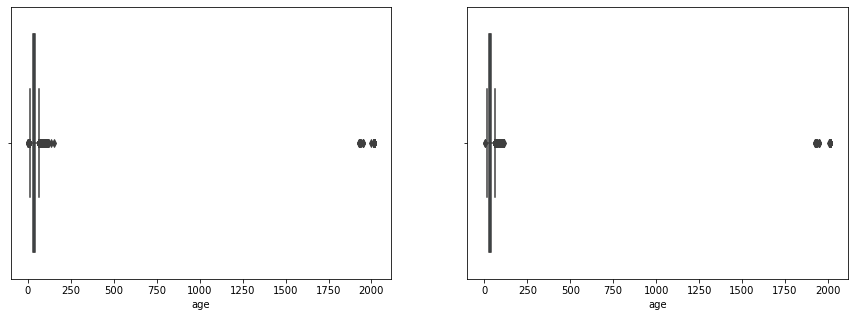

In [21]:
f, a = plt.subplots(1, 2, figsize=(15, 5))
p1 = sns.boxplot(x="age", data=train, ax=a[0])
p2 = sns.boxplot(x="age", data=test, ax=a[1])
# p1.set_xticklabels(p1.get_xticklabels(), rotation=45)
# p2.set_xticklabels(p2.get_xticklabels(), rotation=45)

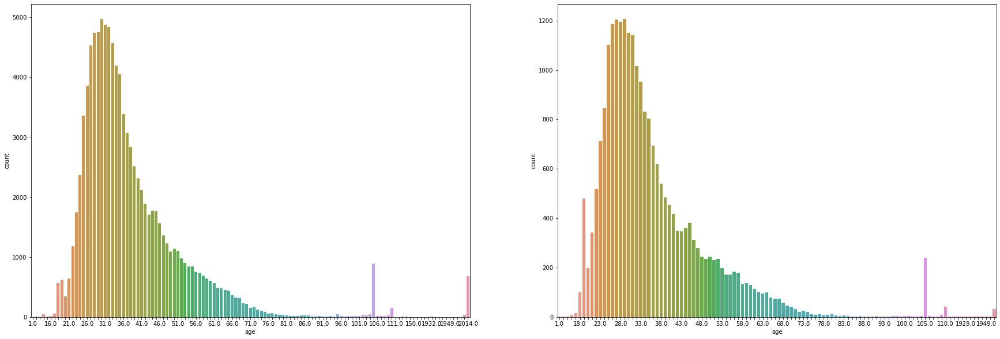

In [22]:
f, a = plt.subplots(1, 2, figsize=(30, 10))
p1 = sns.countplot(x="age", data=train, ax=a[0])
p2 = sns.countplot(x="age", data=test, ax=a[1])
for ind, label in enumerate(p1.get_xticklabels()):
    if ind % 5 == 0:  # every 100th label is kept
        label.set_visible(True)
    else:
        label.set_visible(False)
for ind, label in enumerate(p2.get_xticklabels()):
    if ind % 5 == 0:  # every 100th label is kept
        label.set_visible(True)
    else:
        label.set_visible(False)

The outliers here are errors as the ages of 1900s are not real. These are not really "outliers" in the data and hence can be replaced by corresponding medians of train and test data

In [24]:
q1_train = train.age.quantile(q = 0.25)
q3_train = train.age.quantile(q = 0.75)
iqr_train = q3_train - q1_train
outlier_range_train = 1.5*iqr_train
r_whisker_train = q3_train + outlier_range_train
l_whisker_train = q1_train - outlier_range_train


q1_test = test.age.quantile(q = 0.25)
q3_test = test.age.quantile(q = 0.75)
iqr_test = q3_test - q1_test
outlier_range_test = 1.5*iqr_test
r_whisker_test = q3_test + outlier_range_test
l_whisker_test = q1_test - outlier_range_test


We can include the outliers greater than the right whisker as people of those ages are a part of the data. For the ones that are greater than 120(oldest person alive age), we replace the ages with the median.

In [25]:
age_median_train = train.age.median()
age_median_test = test.age.median()
def replace_outliers(x, med):
    if x > 120:
      return med
    else:
      return x

In [26]:
train.age = train.age.apply(lambda x: replace_outliers(x, age_median_train))
test.age = test.age.apply(lambda x: replace_outliers(x, age_median_test))

### Handling missing values

##### In training data

In [29]:
train.groupby(["affiliate_channel", "affiliate_provider"]).agg(np.median)[["age"]]

age
affiliate_channel affiliate_provider       
api               other                31.0
content           facebook             45.0
                  google               37.0
                  gsp                  42.0
                  other                37.0
direct            direct               34.0
                  other                35.0
other             craigslist           35.0
                  email-marketing      35.0
                  facebook-open-graph  37.0
                  meetup               31.0
                  other                34.0
                  padmapper            28.0
                  wayn                 48.0
remarketing       google               36.0
                  yandex               34.0
sem-brand         baidu                26.0
                  bing                 43.0
                  google               37.0
                  naver                32.0
                  other                37.0
                  yandex               33.5
sem-non-brand     baidu                27.0
                  bing                 48.0
                  facebook             54.5
                  google               37.0
                  naver                29.0
                  other                38.0
                  vast                 41.0
                  yandex               25.0
seo               baidu                28.0
                  bing                 41.0
                  facebook             29.0
                  google               32.0
                  other                33.0
                  yahoo                45.0

Affiliate channel and affiliate provider seem to better describe the age of the user. We fill age nan values with the group median. 

In [30]:
train.age = train.groupby(["affiliate_channel", "affiliate_provider"])["age"].apply(lambda x: x.fillna(x.median()))

##### In test data

In [32]:
test.groupby("gender").agg(np.median).age

gender
-unknown-    34.0
FEMALE       31.0
MALE         32.0
OTHER        30.5
Name: age, dtype: float64

Gender doesn't capture the diversity of the data set.

In [33]:
test.groupby(["affiliate_channel", "affiliate_provider"]).agg(np.median)[["age"]]

age
affiliate_channel affiliate_provider       
api               other                31.0
content           facebook             32.5
                  google               37.5
                  gsp                  57.0
                  other                27.5
                  yandex                NaN
direct            direct               31.0
other             craigslist           29.0
                  email-marketing      35.0
                  facebook-open-graph  33.5
                  meetup               29.0
                  other                31.0
                  padmapper            28.0
remarketing       google               34.5
                  yandex               39.0
sem-brand         baidu                24.0
                  bing                 40.0
                  google               34.0
                  naver                 NaN
                  other                31.0
                  yandex               30.5
sem-non-brand     baidu                 NaN
                  bing                 44.0
                  daum                  NaN
                  google               36.0
                  naver                38.0
                  other                25.0
                  yandex               34.0
seo               baidu                24.0
                  bing                 45.0
                  facebook             27.0
                  google               31.0
                  other                35.0
                  yahoo                37.0

This does capture the different ranges of ages for different affiliate providers and affiliate channels. 

There are NaN values for some of these categories though, like affiliate channel content and affiliate provider yandex, sem-brand naver and sem-non-brand daum and baidu. These datapoints are filled with nan and are only 1 per each, so we fill these later by overall median age. 

### AGE

In [36]:
test.age = test.groupby(["affiliate_channel", "affiliate_provider"])["age"].apply(lambda x: x.fillna(x.median()))

These 5 NaN values can be filled by the overall median

In [37]:
test.age.fillna(test.age.median(), inplace=True)

#### Date first booking

In [38]:
train.date_first_booking.isna().sum()

97807

In [39]:
train[train.country_destination == 'NDF'].date_first_booking.isna().sum()

97807

We can see that whenever date first booking is NaN, country destination is NDF. So, there is a 100% correlation between date_first_booking and NDF and it also makes sense because when there is no booking done, country would be NDF and date would be NaN. It makes sense to remove all the rows where date first booking is NaN, as there is no learning involved, in both the test and train data

#### First affiliate tracked

There are few nan values, and it's a categorical data. So, this can be filled with mode.

##### In training data

In [41]:
#print(train.first_affiliate_tracked.isna().sum())
train.first_affiliate_tracked.value_counts()

untracked        85964
linked           37983
omg              33106
tracked-other     5771
product           1156
marketing          115
local ops           15
Name: first_affiliate_tracked, dtype: int64

In [42]:
train.first_affiliate_tracked.fillna("untracked", inplace=True)

##### In test data

In [44]:
#print(test.first_affiliate_tracked.isna().sum())
test.first_affiliate_tracked.value_counts()

untracked        23268
omg              10876
linked            8304
product            400
tracked-other      385
marketing           24
local ops           19
Name: first_affiliate_tracked, dtype: int64

In [45]:
test.first_affiliate_tracked.fillna("untracked", inplace=True)

## Univariate Analysis

#### Gender

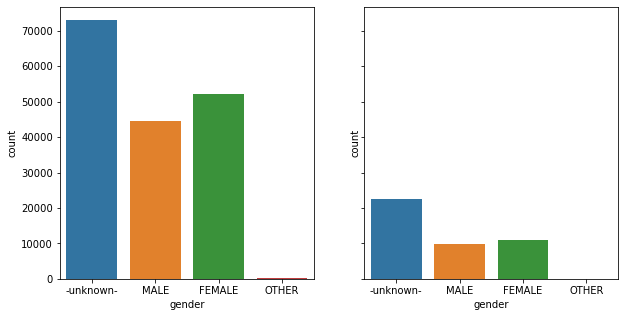

In [46]:
f, a = plt.subplots(1, 2, sharey=True, figsize=(10, 5))
sns.countplot(x="gender", data=train, ax=a[0])
sns.countplot(x="gender", data=test, ax=a[1])

There are very few datapoints with the gender "Other". Majority of the users have gender "Unknown", maybe they preferred anonymity. Female bookings are more than male bookings in both test and train datasets.

Gender categories are not ordinal so this feature can be one hot encoded

#### Signup method

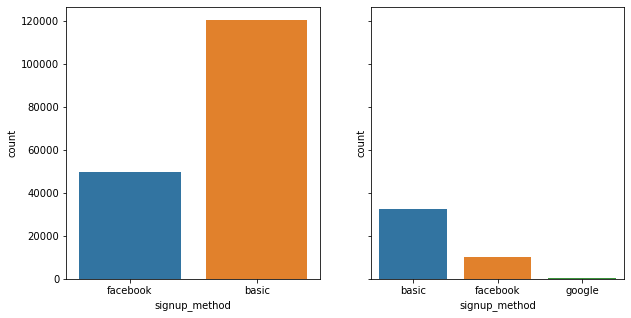

In [47]:
f, a = plt.subplots(1, 2, sharey=True, figsize=(10, 5))
sns.countplot(x="signup_method", data=train, ax=a[0])
sns.countplot(x="signup_method", data=test, ax=a[1])

There is a new category in the test data set. This needs to be considered while encoding the categories. 

By combining train and test datasets, and then encoding them, we can capture all possible categories, then splitting back into train and test datasets


#### Language

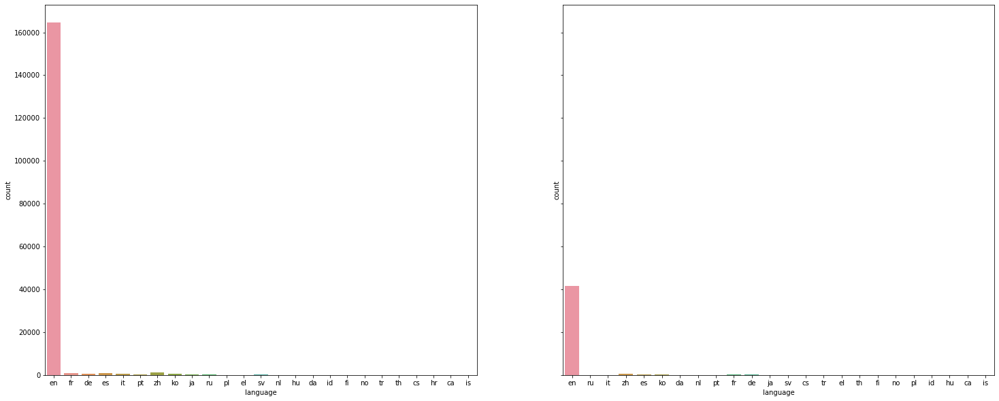

In [48]:
f, a = plt.subplots(1, 2, sharey=True, figsize=(25, 10))
sns.countplot(x="language", data=train, ax=a[0])
sns.countplot(x="language", data=test, ax=a[1])

Very small number of bookings with other languages. We can combine these categories to form a new "other" category.

#### Affiliate channel

[Text(0, 0, 'direct'),
 Text(0, 0, 'api'),
 Text(0, 0, 'sem-non-brand'),
 Text(0, 0, 'sem-brand'),
 Text(0, 0, 'seo'),
 Text(0, 0, 'content'),
 Text(0, 0, 'other'),
 Text(0, 0, 'remarketing')]

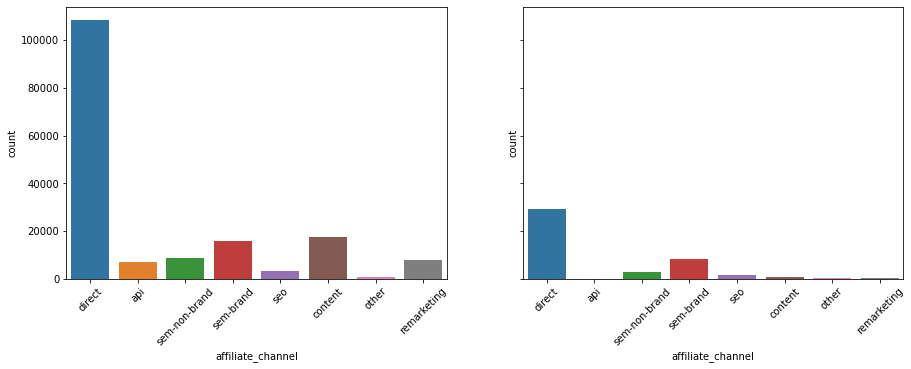

In [49]:
f, a = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(15, 5))
p1 = sns.countplot(x="affiliate_channel", data=train, ax=a[0])
p2 = sns.countplot(x="affiliate_channel", data=test, ax=a[1])
p1.set_xticklabels(p1.get_xticklabels(), rotation=45)
p2.set_xticklabels(p2.get_xticklabels(), rotation=45)

Not too many categories to be combined, and nominal categories. Can be one hot encoded

#### Affiliate provider

[Text(0, 0, 'direct'),
 Text(0, 0, 'other'),
 Text(0, 0, 'google'),
 Text(0, 0, 'facebook'),
 Text(0, 0, 'yahoo'),
 Text(0, 0, 'padmapper'),
 Text(0, 0, 'bing'),
 Text(0, 0, 'baidu'),
 Text(0, 0, 'email-marketing'),
 Text(0, 0, 'facebook-open-graph'),
 Text(0, 0, 'meetup'),
 Text(0, 0, 'naver'),
 Text(0, 0, 'craigslist'),
 Text(0, 0, 'gsp'),
 Text(0, 0, 'yandex'),
 Text(0, 0, 'daum')]

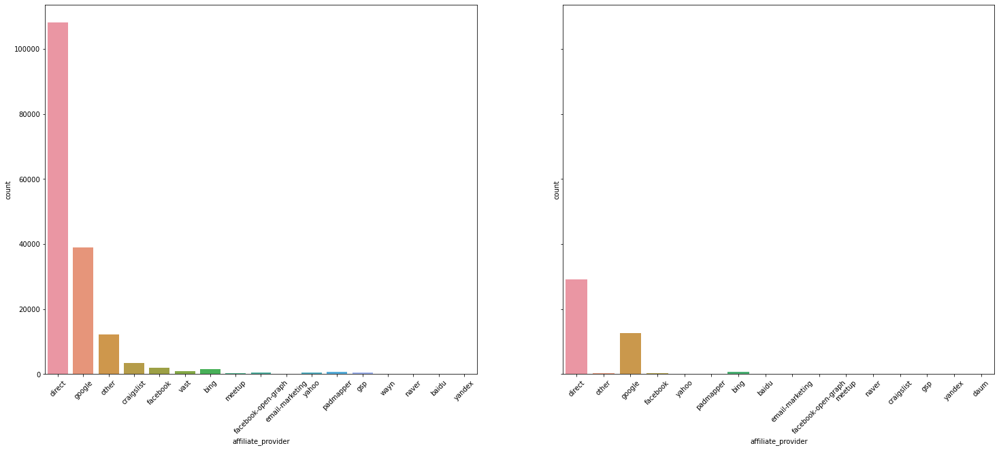

In [50]:
f, a = plt.subplots(1, 2, sharey=True, figsize=(25, 10))
p1 = sns.countplot(x="affiliate_provider", data=train, ax=a[0])
p2 = sns.countplot(x="affiliate_provider", data=test, ax=a[1])
p1.set_xticklabels(p1.get_xticklabels(), rotation=45)
p2.set_xticklabels(p2.get_xticklabels(), rotation=45)

In [51]:
print("Training data affiliate_provider categories-{}".format(len(train.affiliate_provider.value_counts().index)),
      "\nTesting data affiliate_provider categories-{}".format(len(test.affiliate_provider.value_counts().index)))

Training data affiliate_provider categories-17 
Testing data affiliate_provider categories-16


In [52]:
train.affiliate_provider.value_counts()

direct                 108215
google                  39049
other                   12259
craigslist               3469
facebook                 2040
bing                     1634
vast                      829
padmapper                 699
facebook-open-graph       516
yahoo                     454
gsp                       442
meetup                    341
email-marketing           112
naver                      39
baidu                      22
yandex                      9
wayn                        8
Name: affiliate_provider, dtype: int64

In [53]:
test.affiliate_provider.value_counts()

direct                 29211
google                 12644
bing                     694
other                    290
facebook                 233
padmapper                 69
email-marketing           54
yahoo                     42
facebook-open-graph       29
naver                     13
gsp                       11
yandex                     8
baidu                      7
meetup                     6
craigslist                 2
daum                       1
Name: affiliate_provider, dtype: int64

There are few different categories in train and test datasets, similar to signup_method. Encoding must be done **after combining categories**.

There are also categories with very few datapoints, such as daum, wayn, yandex, baidu, naver. These can be combined to form a new category

#### First affiliate tracked

[Text(0, 0, 'untracked'),
 Text(0, 0, 'omg'),
 Text(0, 0, 'linked'),
 Text(0, 0, 'tracked-other'),
 Text(0, 0, 'product'),
 Text(0, 0, 'local ops'),
 Text(0, 0, 'marketing')]

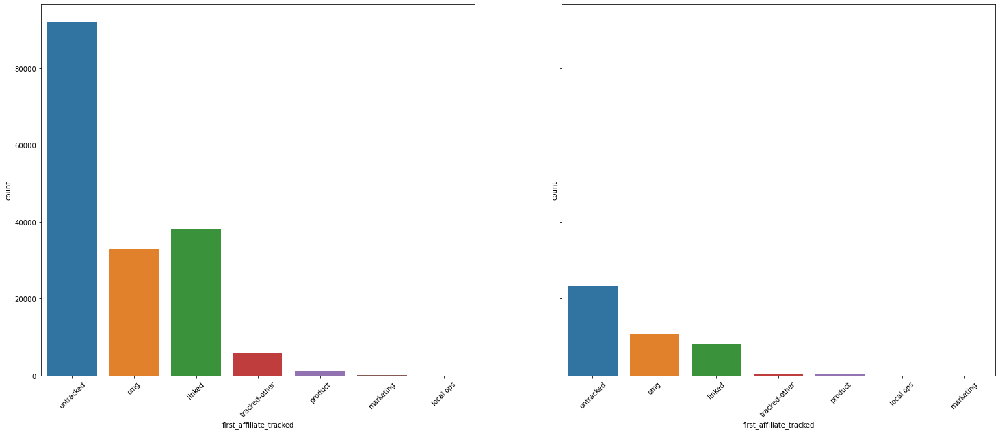

In [54]:
f, a = plt.subplots(1, 2, sharey=True, figsize=(25, 10))
p1 = sns.countplot(x="first_affiliate_tracked", data=train, ax=a[0])
p2 = sns.countplot(x="first_affiliate_tracked", data=test, ax=a[1])
p1.set_xticklabels(p1.get_xticklabels(), rotation=45)
p2.set_xticklabels(p2.get_xticklabels(), rotation=45)

Majority of the first affiliates are untracked

This feature doesn't have too many categories and is nominal. Can be one hot encoded.

#### Signup app

[Text(0, 0, 'Web'),
 Text(0, 0, 'iOS'),
 Text(0, 0, 'Android'),
 Text(0, 0, 'Moweb')]

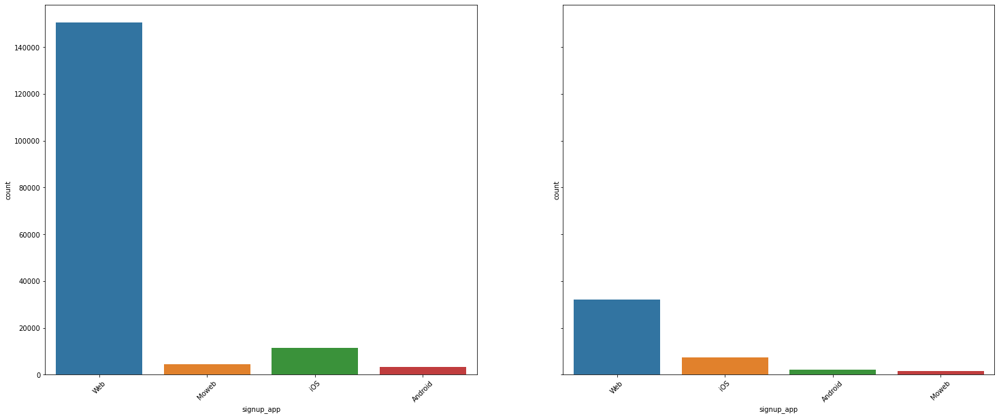

In [55]:
f, a = plt.subplots(1, 2, sharey=True, figsize=(25, 10))
p1 = sns.countplot(x="signup_app", data=train, ax=a[0])
p2 = sns.countplot(x="signup_app", data=test, ax=a[1])
p1.set_xticklabels(p1.get_xticklabels(), rotation=45)
p2.set_xticklabels(p2.get_xticklabels(), rotation=45)

Web is the most popular way to signup through.

Nominal feature with 4 categories. Can be one hot encoded.

#### First device type

[Text(0, 0, 'Mac Desktop'),
 Text(0, 0, 'iPhone'),
 Text(0, 0, 'Windows Desktop'),
 Text(0, 0, 'iPad'),
 Text(0, 0, 'Other/Unknown'),
 Text(0, 0, 'Android Phone'),
 Text(0, 0, 'Android Tablet'),
 Text(0, 0, 'Desktop (Other)'),
 Text(0, 0, 'SmartPhone (Other)')]

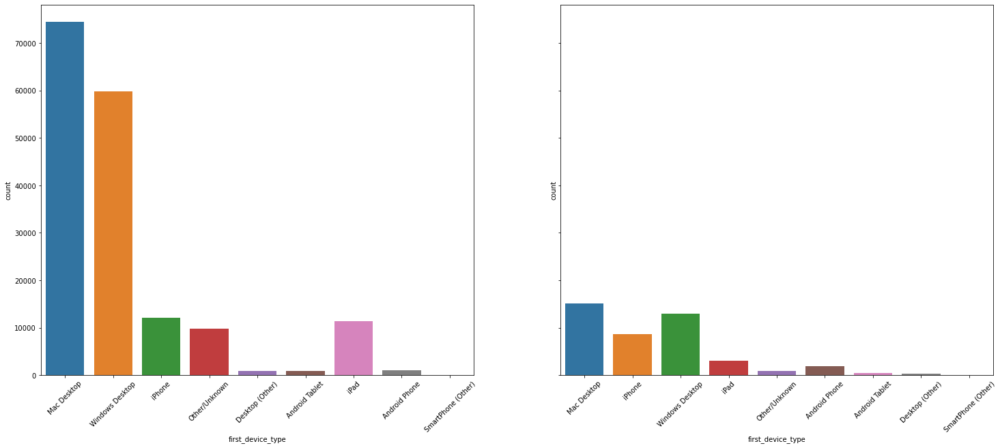

In [56]:
f, a = plt.subplots(1, 2, sharey=True, figsize=(25, 10))
p1 = sns.countplot(x="first_device_type", data=train, ax=a[0])
p2 = sns.countplot(x="first_device_type", data=test, ax=a[1])
p1.set_xticklabels(p1.get_xticklabels(), rotation=45)
p2.set_xticklabels(p2.get_xticklabels(), rotation=45)

Nominal feature, can be one hot encoded.

#### First browser

[Text(0, 0, 'Safari'),
 Text(0, 0, 'Mobile Safari'),
 Text(0, 0, 'Chrome'),
 Text(0, 0, '-unknown-'),
 Text(0, 0, 'IE'),
 Text(0, 0, 'Firefox'),
 Text(0, 0, 'Chrome Mobile'),
 Text(0, 0, 'Apple Mail'),
 Text(0, 0, 'Android Browser'),
 Text(0, 0, 'Chromium'),
 Text(0, 0, 'AOL Explorer'),
 Text(0, 0, 'BlackBerry Browser'),
 Text(0, 0, 'Opera'),
 Text(0, 0, 'SiteKiosk'),
 Text(0, 0, 'IE Mobile'),
 Text(0, 0, 'Outlook 2007'),
 Text(0, 0, 'Mobile Firefox'),
 Text(0, 0, 'CoolNovo'),
 Text(0, 0, 'Silk'),
 Text(0, 0, 'Maxthon'),
 Text(0, 0, 'IceWeasel'),
 Text(0, 0, 'Iron'),
 Text(0, 0, 'Sogou Explorer'),
 Text(0, 0, 'Pale Moon'),
 Text(0, 0, 'IceDragon'),
 Text(0, 0, 'Yandex.Browser'),
 Text(0, 0, 'TheWorld Browser'),
 Text(0, 0, 'RockMelt'),
 Text(0, 0, 'Avant Browser')]

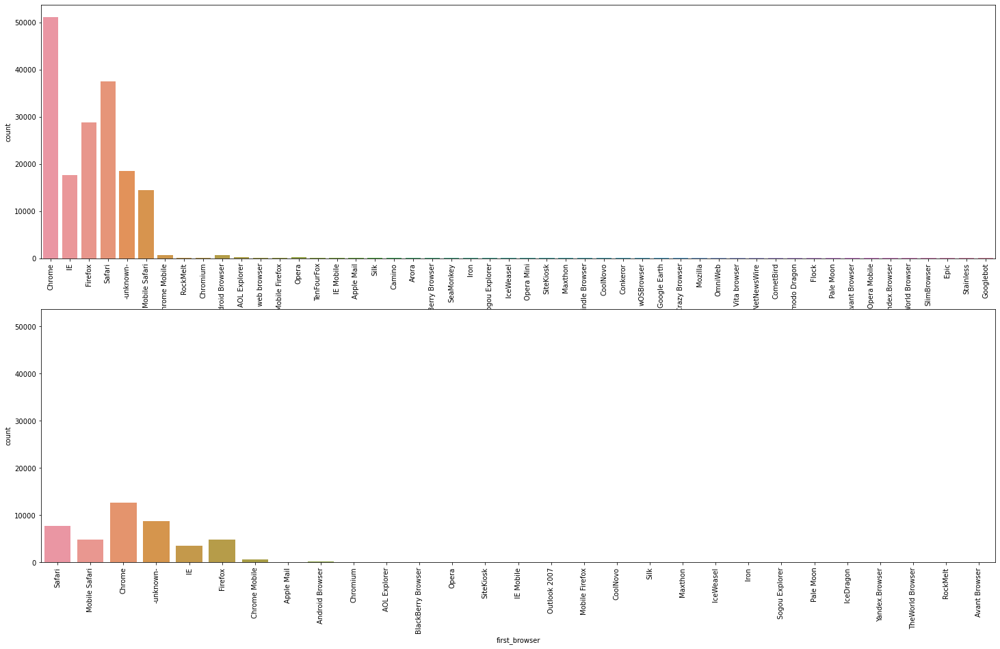

In [57]:
f, a = plt.subplots(2, 1, sharey=True, figsize=(25, 15))
p1 = sns.countplot(x="first_browser", data=train, ax=a[0])
p2 = sns.countplot(x="first_browser", data=test, ax=a[1])
p1.set_xticklabels(p1.get_xticklabels(), rotation=90)
p2.set_xticklabels(p2.get_xticklabels(), rotation=90)

Chrome is the most used web browser than others in both test and train data.

Test data has fewer browsers than train data. This can be encoded accordingly by **concatenating test and train data**.

There are very few bookings(1-100) through some browsers like google earth, palm pre web browser, etc. We can make a new category combining all such categories.

#### Signup flow

[Text(0, 0, '0'),
 Text(0, 0, '8'),
 Text(0, 0, '12'),
 Text(0, 0, '21'),
 Text(0, 0, '23'),
 Text(0, 0, '24'),
 Text(0, 0, '25')]

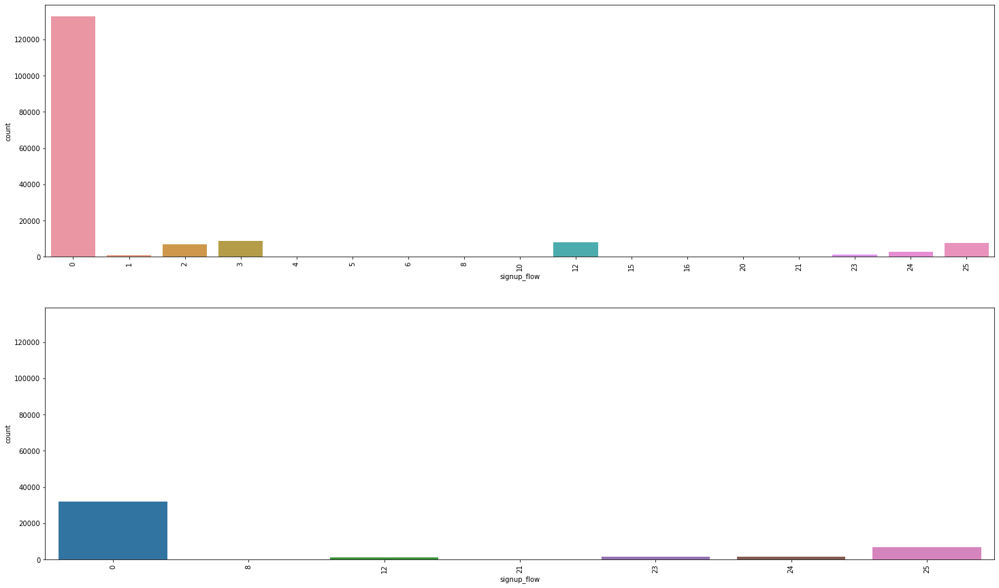

In [59]:
f, a = plt.subplots(2, 1, sharey=True, figsize=(25, 15))
p1 = sns.countplot(x="signup_flow", data=train, ax=a[0])
p2 = sns.countplot(x="signup_flow", data=test, ax=a[1])
p1.set_xticklabels(p1.get_xticklabels(), rotation=90)
p2.set_xticklabels(p2.get_xticklabels(), rotation=90)

Test data doesn't have users of all signup flows. Users of 0 signup flow are the highest by far. Maybe this is because large number of users have not choosen any country destination

#### Date account created

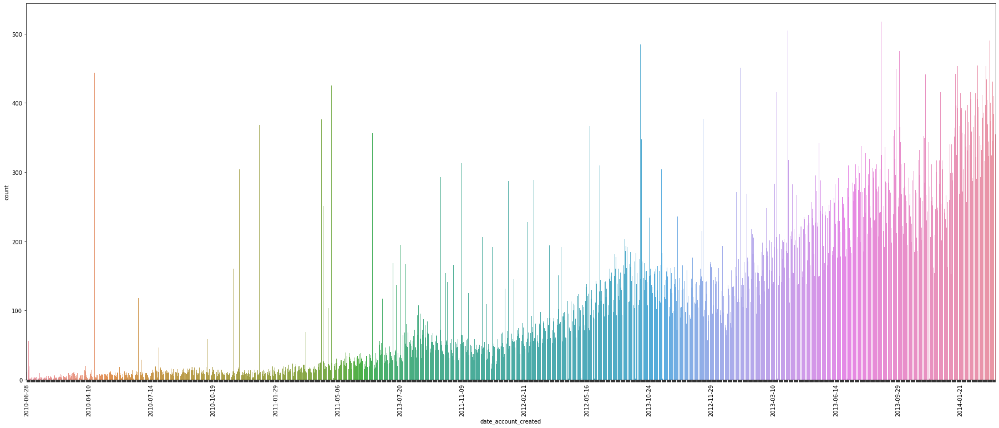

In [60]:
f, a = plt.subplots(figsize=(25, 10))
f.tight_layout()

p1 = sns.countplot(x="date_account_created", data=train)
p1.set_xticklabels(p1.get_xticklabels(), rotation=90)
for ind, label in enumerate(p1.get_xticklabels()):
    if ind % 100 == 0:  # every 100th label is kept
        label.set_visible(True)
    else:
        label.set_visible(False)

There are some days where there are particularly more accounts created compared to other days around that date. Other than that, the accounts created keep increasing every year, maybe due to the increasing popularity of airbnb

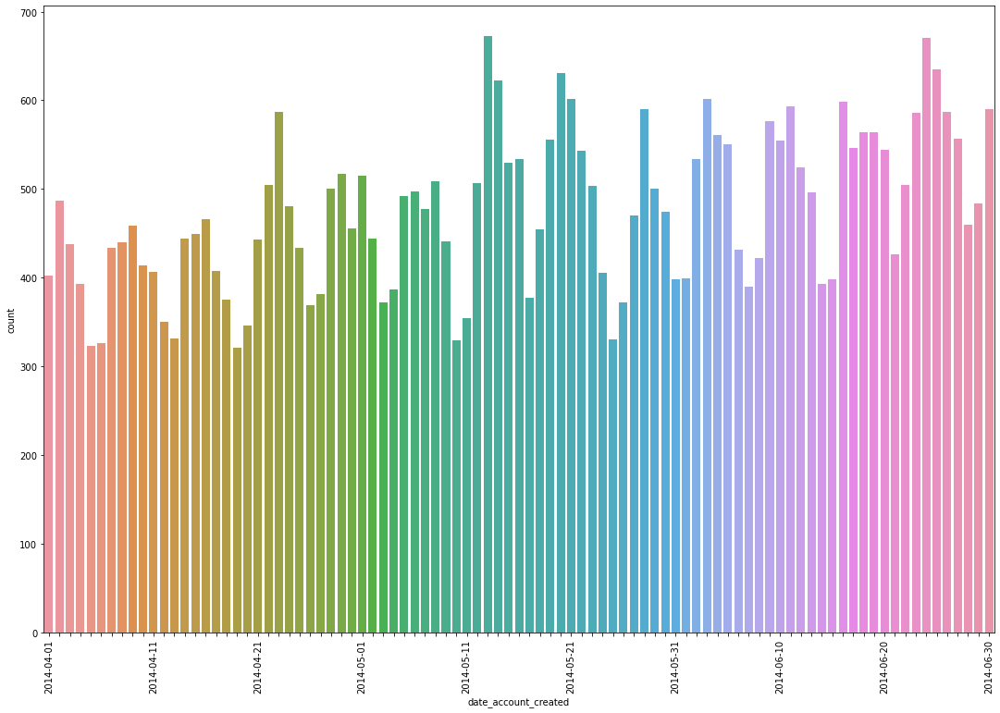

In [61]:
f, a = plt.subplots(figsize=(15, 10))
f.tight_layout()

p2 = sns.countplot(x="date_account_created", data=test)
p2.set_xticklabels(p2.get_xticklabels(), rotation=90)
for ind, label in enumerate(p2.get_xticklabels()):
    if ind % 10 == 0:  # every 10th label is kept
        label.set_visible(True)
    else:
        label.set_visible(False)

The pattern above seems periodic. Maybe it has got to do with the weekdays.

Type of date_account_created is a string, so let's convert this to an analyzable type, pd.DateTime

In [62]:
train.date_account_created = pd.to_datetime(train.date_account_created)
test.date_account_created = pd.to_datetime(test.date_account_created)

We can analyze the accounts creation per month

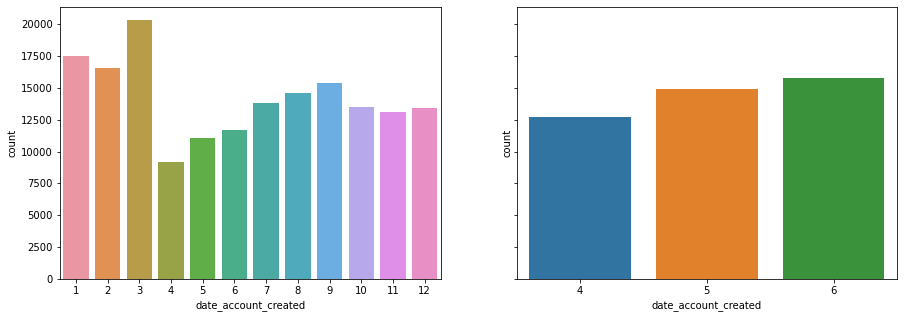

In [63]:
f, a = plt.subplots(1, 2, sharey=True, figsize=(15, 5))

month_tr = train['date_account_created'].dt.month
month_ts = test['date_account_created'].dt.month

p1 = sns.countplot(x=month_tr, ax=a[0])
p2 = sns.countplot(x=month_ts, ax=a[1])
# p1.set_xticklabels(p1.get_xticklabels(), rotation=45)
# p2.set_xticklabels(p2.get_xticklabels(), rotation=45)

Accounts created are highest in the month of March. After a huge drop in April, creations steadily increase till September. this might be because of summer vacation around that time

In the test data, accounts are created only in the months of april may and july, with july being the highest. But we are not going to do anything about it because the model should be generalizable, and we've to avoid data snooping

We can extract day of the week for further analysis

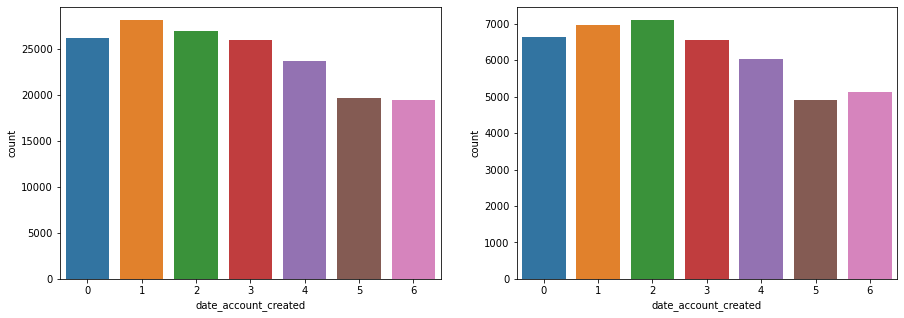

In [64]:
f, a = plt.subplots(1, 2, figsize=(15, 5))

weekday_tr = train['date_account_created'].dt.dayofweek
weekday_ts = test['date_account_created'].dt.dayofweek

p1 = sns.countplot(x=weekday_tr, ax=a[0])
p2 = sns.countplot(x=weekday_ts, ax=a[1])
# p1.set_xticklabels(p1.get_xticklabels(), rotation=45)
# p2.set_xticklabels(p2.get_xticklabels(), rotation=45)

Monday has highest account creations in training data and tuesday in testing data

#### Timestamp

Converting to standard date time object

In [65]:
train.timestamp_first_active = pd.to_datetime(train.timestamp_first_active, format="%Y%m%d%H%M%S").dt.strftime('%Y-%m-%d')
test.timestamp_first_active = pd.to_datetime(test.timestamp_first_active, format="%Y%m%d%H%M%S").dt.strftime('%Y-%m-%d')

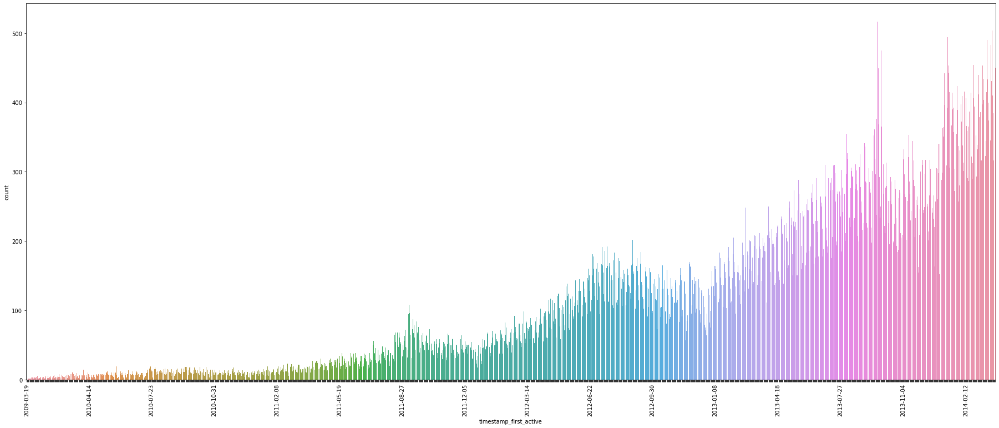

In [66]:
f, a = plt.subplots(figsize=(25, 10))
f.tight_layout()

p1 = sns.countplot(x="timestamp_first_active", data=train)
p1.set_xticklabels(p1.get_xticklabels(), rotation=90)
for ind, label in enumerate(p1.get_xticklabels()):
    if ind % 100 == 0:  # every 10th label is kept
        label.set_visible(True)
    else:
        label.set_visible(False)


Similar to date account crated, number of people active for the first time increase with the year. 

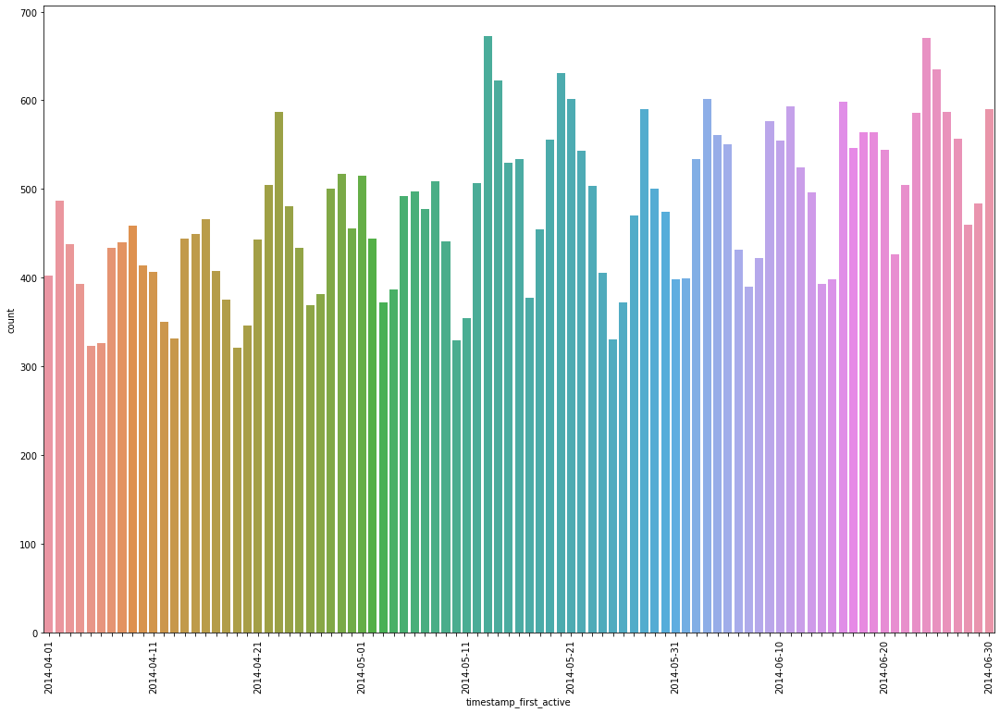

In [67]:
f, a = plt.subplots(figsize=(15, 10))
f.tight_layout()

p2 = sns.countplot(x="timestamp_first_active", data=test)
p2.set_xticklabels(p2.get_xticklabels(), rotation=90)
for ind, label in enumerate(p2.get_xticklabels()):
    if ind % 10 == 0:  # every 10th label is kept
        label.set_visible(True)
    else:
        label.set_visible(False)

This also seems to have a be periodic. Let's analyse the months and day of the week for this. For this, let's convert the column back to a datetime object

In [68]:
train.timestamp_first_active = pd.to_datetime(train.timestamp_first_active)
test.timestamp_first_active = pd.to_datetime(test.timestamp_first_active)

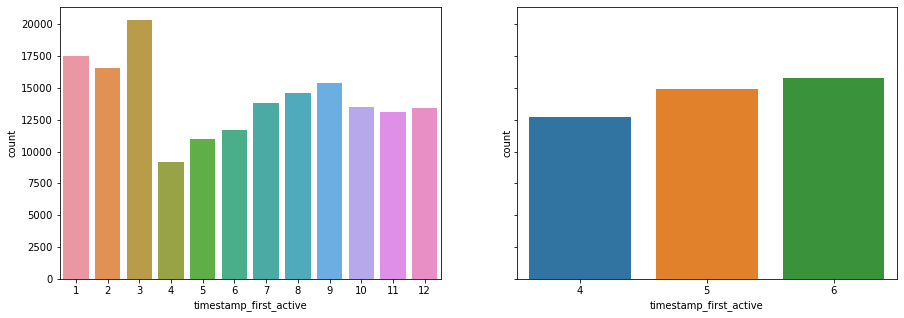

In [69]:
f, a = plt.subplots(1, 2, sharey=True, figsize=(15, 5))

month_tr = train['timestamp_first_active'].dt.month
month_ts = test['timestamp_first_active'].dt.month

p1 = sns.countplot(x=month_tr, ax=a[0])
p2 = sns.countplot(x=month_ts, ax=a[1])
# p1.set_xticklabels(p1.get_xticklabels(), rotation=45)
# p2.set_xticklabels(p2.get_xticklabels(), rotation=45)

Once again the higest active users are seen in the month of March.

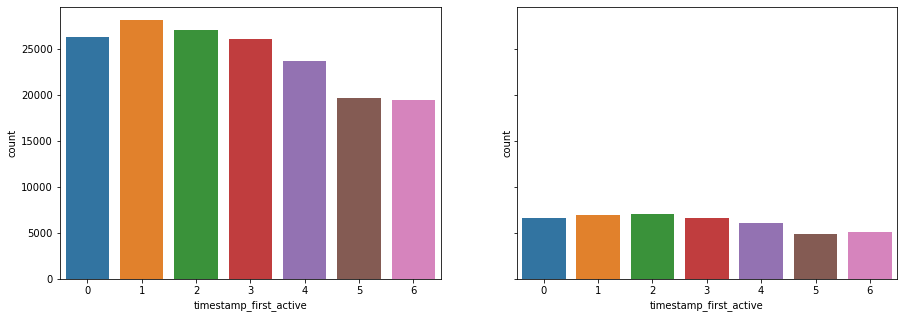

In [70]:
f, a = plt.subplots(1, 2, sharey=True, figsize=(15, 5))

weekday_tr = train['timestamp_first_active'].dt.dayofweek
weekday_ts = test['timestamp_first_active'].dt.dayofweek

p1 = sns.countplot(x=weekday_tr, ax=a[0])
p2 = sns.countplot(x=weekday_ts, ax=a[1])
# p1.set_xticklabels(p1.get_xticklabels(), rotation=45)
# p2.set_xticklabels(p2.get_xticklabels(), rotation=45)

Once again, monday has the most users active for the first time in train, and tuesday in test

##### Correlation with date account created

Plots of time stamp first active and date account created seem almost similar. Let's check their correlation by converting both to number of days from 2009-01-01 as 2009 is the first year in the training data




In [71]:
(train.timestamp_first_active.sub(pd.to_datetime('2009-01-01')))/np.timedelta64(1, 'D')

0           77.0
1          142.0
2          159.0
3          303.0
4          341.0
           ...  
170132    1915.0
170133    1915.0
170134    1915.0
170135    1915.0
170136    1915.0
Name: timestamp_first_active, Length: 170137, dtype: float64

In [72]:
(train.date_account_created.sub(pd.to_datetime('2009-01-01')))/np.timedelta64(1, 'D')

0          543.0
1          874.0
2          635.0
3         1068.0
4          621.0
           ...  
170132    1915.0
170133    1915.0
170134    1915.0
170135    1915.0
170136    1915.0
Name: date_account_created, Length: 170137, dtype: float64

Converting this to int by dividing by single day time delta object

In [73]:
train_timestamp = (train.timestamp_first_active.sub(pd.to_datetime('2009-01-01')))/np.timedelta64(1, 'D') # to int as it is expressed in timedelta64 days
train_dateacc = (train.date_account_created.sub(pd.to_datetime('2009-01-01')))/np.timedelta64(1, 'D') # to int as it is expressed in timedelta64 days

In [74]:
train_timestamp.corr(train_dateacc)

0.9989865485172157

That's almost 1 correlation in training data. We can drop one column. Let's drop date account created

In [75]:
train.drop("date_account_created", axis=1, inplace=True)
test.drop("date_account_created", axis=1, inplace=True)

#### Date First Booking

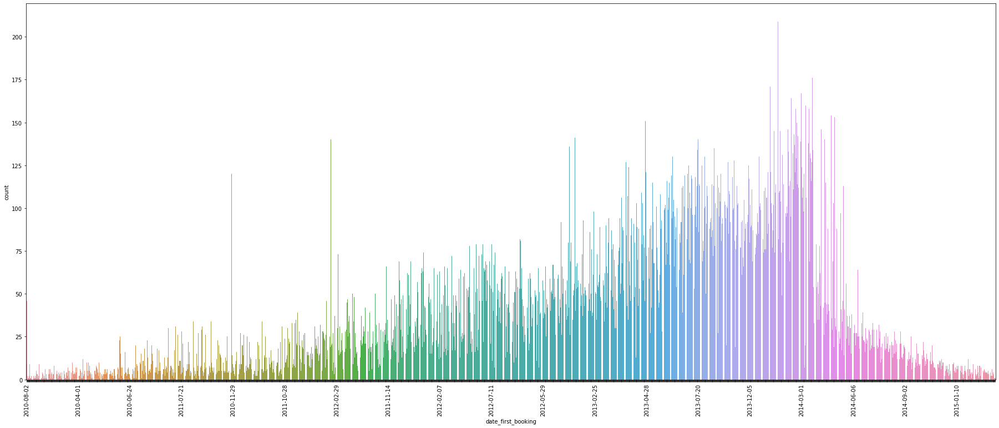

In [76]:
f, a = plt.subplots(figsize=(25, 10))
f.tight_layout()

p1 = sns.countplot(x="date_first_booking", data=train)
p1.set_xticklabels(p1.get_xticklabels(), rotation=90)
for ind, label in enumerate(p1.get_xticklabels()):
    if ind % 100 == 0:  # every 10th label is kept
        label.set_visible(True)
    else:
        label.set_visible(False)


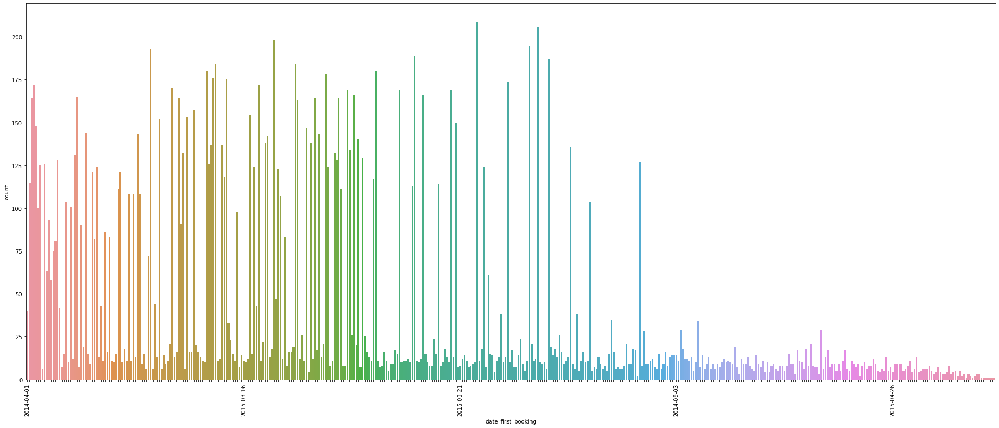

In [77]:
f, a = plt.subplots(figsize=(25, 10))
f.tight_layout()

p1 = sns.countplot(x="date_first_booking", data=test)
p1.set_xticklabels(p1.get_xticklabels(), rotation=90)
for ind, label in enumerate(p1.get_xticklabels()):
    if ind % 100 == 0:  # every 10th label is kept
        label.set_visible(True)
    else:
        label.set_visible(False)


Bookings seem to follow a periodical pattern again. Let's convert to datetime and look at months and days of the week

In [78]:
train.date_first_booking = pd.to_datetime(train.date_first_booking)
test.date_first_booking = pd.to_datetime(test.date_first_booking)

Year

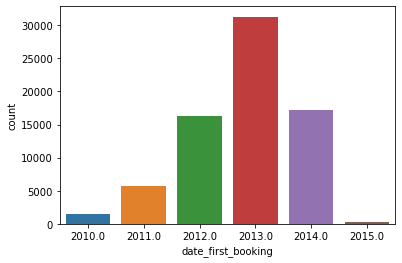

In [79]:
sns.countplot(x=train.date_first_booking.dt.year)

2013 has the highest number of bookings for airbnb

Month

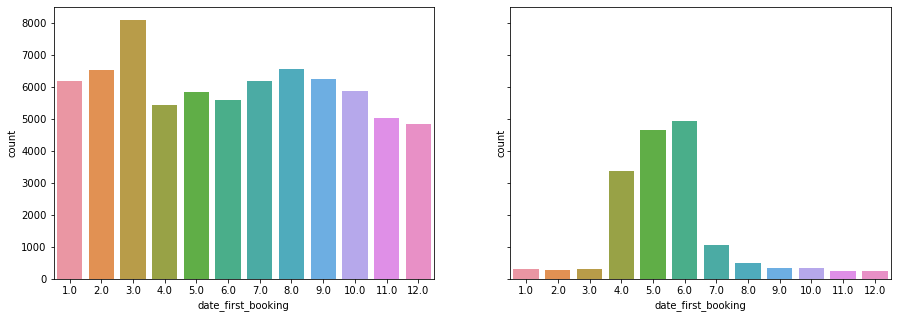

In [80]:
f, a = plt.subplots(1, 2, sharey=True, figsize=(15, 5))

month_tr = train['date_first_booking'].dt.month
month_ts = test['date_first_booking'].dt.month

p1 = sns.countplot(x=month_tr, ax=a[0])
p2 = sns.countplot(x=month_ts, ax=a[1])
# p1.set_xticklabels(p1.get_xticklabels(), rotation=45)
# p2.set_xticklabels(p2.get_xticklabels(), rotation=45)


Week of the day

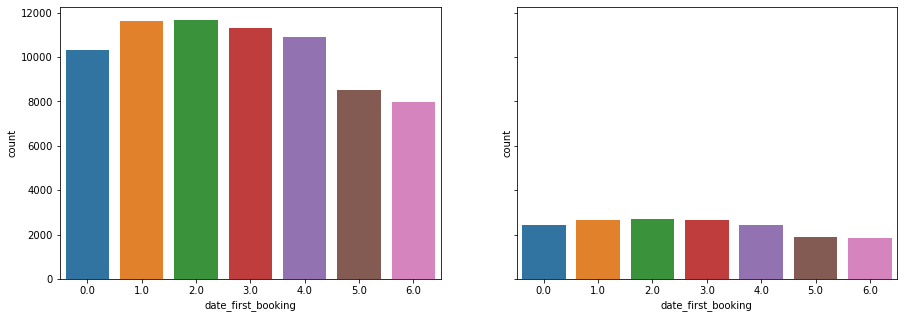

In [81]:
f, a = plt.subplots(1, 2, sharey=True, figsize=(15, 5))

weekday_tr = train['date_first_booking'].dt.dayofweek
weekday_ts = test['date_first_booking'].dt.dayofweek

p1 = sns.countplot(x=weekday_tr, ax=a[0])
p2 = sns.countplot(x=weekday_ts, ax=a[1])
# p1.set_xticklabels(p1.get_xticklabels(), rotation=45)
# p2.set_xticklabels(p2.get_xticklabels(), rotation=45)

Similar to the above features, bookings also happen more on monday-tuesdays and in the months of March-June

##### Correlation with timestamp first active

In [82]:
train_timestamp = (train.timestamp_first_active.sub(pd.to_datetime('2009-01-01')))/np.timedelta64(1, 'D') # to int as it is expressed in timedelta64 days
train_datefirst = (train.date_first_booking.sub(pd.to_datetime('2009-01-01')))/np.timedelta64(1, 'D') # to int as it is expressed in timedelta64 days

test_timestamp = (test.timestamp_first_active.sub(pd.to_datetime('2009-01-01')))/np.timedelta64(1, 'D') # to int as it is expressed in timedelta64 days
test_datefirst = (test.date_first_booking.sub(pd.to_datetime('2009-01-01')))/np.timedelta64(1, 'D') # to int as it is expressed in timedelta64 days

In [83]:
train_timestamp.corr(train_datefirst)

0.9641367568465995

That's quite high correlation of 0.96. We can drop timestamp here.

In [84]:
train.drop("timestamp_first_active", axis=1, inplace=True)
test.drop("timestamp_first_active", axis=1, inplace=True)

Day of the year

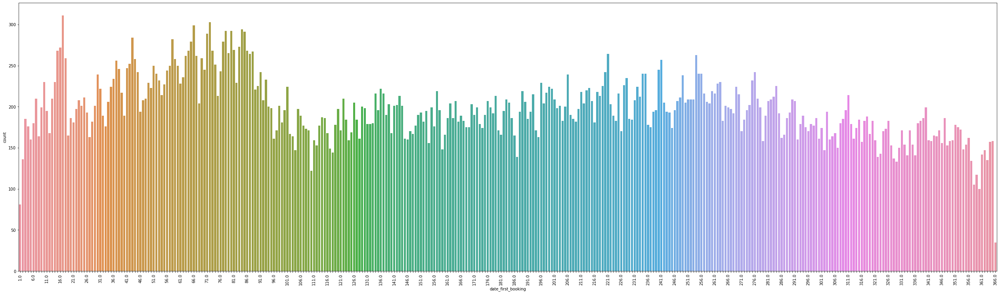

In [85]:

f, a = plt.subplots(figsize=(35, 10))
f.tight_layout()

p1 = sns.countplot(x=train.date_first_booking.dt.dayofyear)
p1.set_xticklabels(p1.get_xticklabels(), rotation=90)
for ind, label in enumerate(p1.get_xticklabels()):
    if ind % 5 == 0:  # every 5th label is kept
        label.set_visible(True)
    else:
        label.set_visible(False)


This is a combination of both the month and day of the week as we observe both the periodic nature of week days and growing bookings along the months of may-june and decrease thereafter.

#### Country Destination

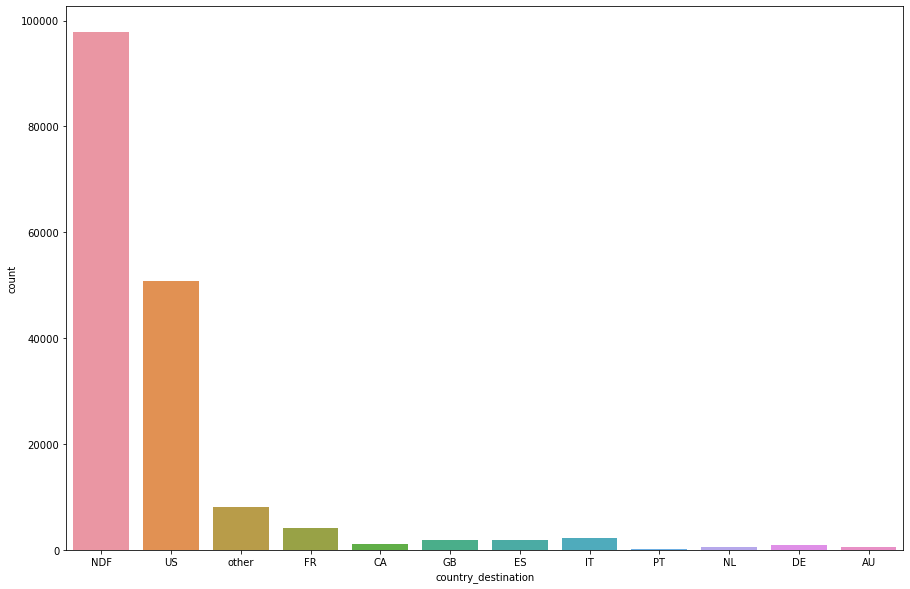

In [86]:
plt.figure(figsize=(15, 10))
sns.countplot(x=train.country_destination)

Most of the users don't book any destination, they may have just browsed and haven't actually made a booking. Other than that, next major destination is the US.

## Bivariate analysis

### Country Destination and features analysis

Seeing how each feature affects input destination

#### Gender vs Country Destination
Let's see if gender has any say over country destination

In [87]:
ndf_us = train[(train.country_destination == "NDF") | (train.country_destination == "US")]
rest = train[(train.country_destination != "NDF") & (train.country_destination != "US")]

#### For NDF and US

In [88]:
fig = px.parallel_categories(ndf_us, dimensions=["gender", "country_destination"])
fig.show()

Unknown gender mostly prefer NDF over other countries. Difference between NDF and US is much lesser for males and females compared to unknown gender. Meaning, **provided gender, the user is more likely to actually book a destination**. Hence, it is better to keep the category unknown as it gives us this information.

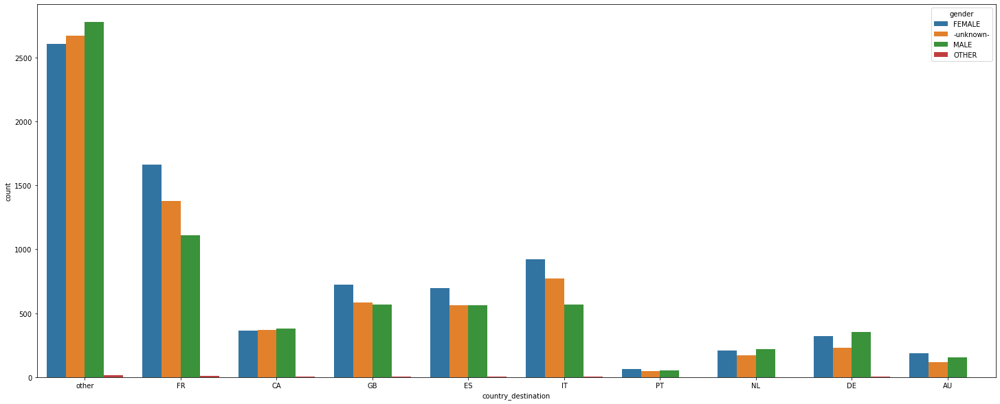

In [89]:
plt.figure(figsize=(25, 10))
sns.countplot(x="country_destination", hue="gender", data=rest)

In most of the countries(except other), female bookings are more than men or unknown.

#### Age and country destination

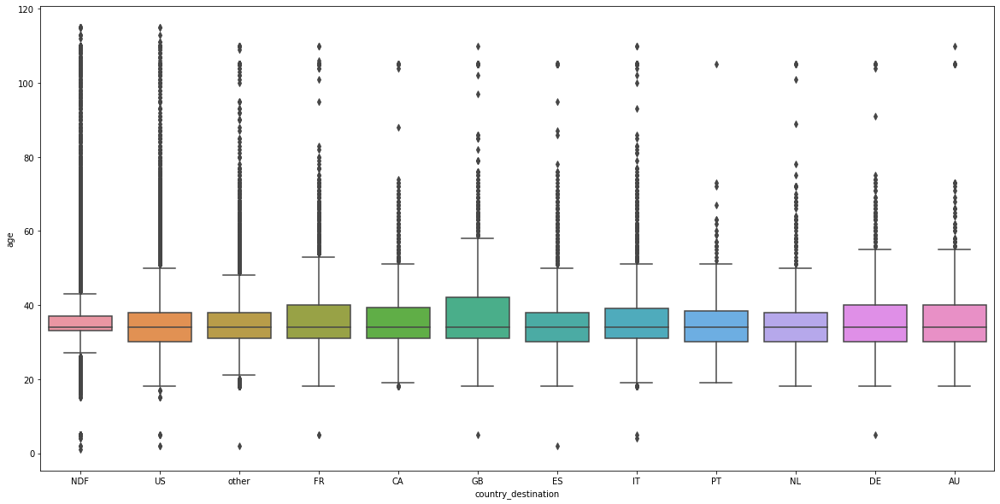

In [91]:
plt.figure(figsize=(20, 10))
sns.boxplot(x="country_destination", y="age", data=train)

GB quantile is more on the older side, so GB has more older travellers

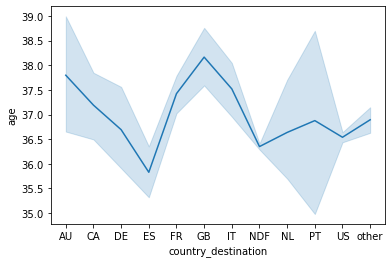

In [92]:
sns.lineplot(x="country_destination", y="age", data=train)

Spain has the youngest travelling users on average, and Great Britain the oldest on avg. 

#### Date first booking

In [93]:
train['date_first_year'] = train['date_first_booking'].dt.year

Extracted year from date_first_booking

In [96]:
ndf = train[(train.country_destination == "NDF")]
us = train[(train.country_destination == "US")]
rest = train[(train.country_destination != "NDF") & (train.country_destination != "US")]

We know that all the date_first_booking values in the ndf are null

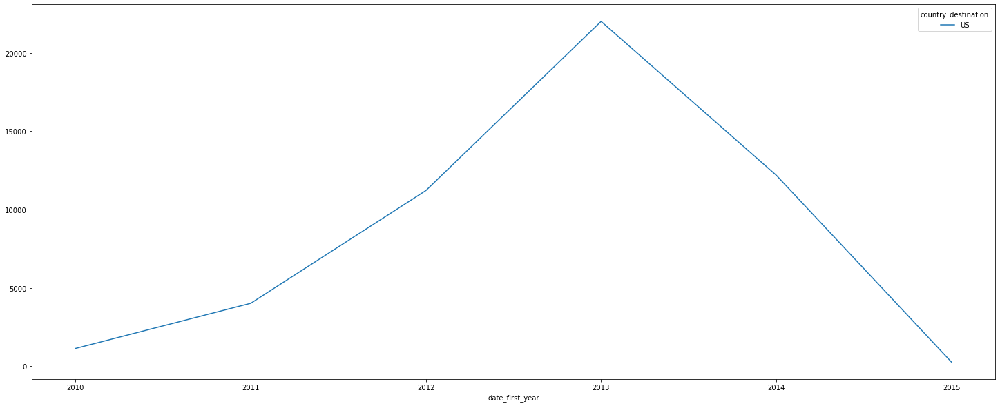

In [97]:
(us
 .groupby(['date_first_year', 'country_destination'])
 .size()
 .unstack()
 .plot(figsize=(25, 10))
)


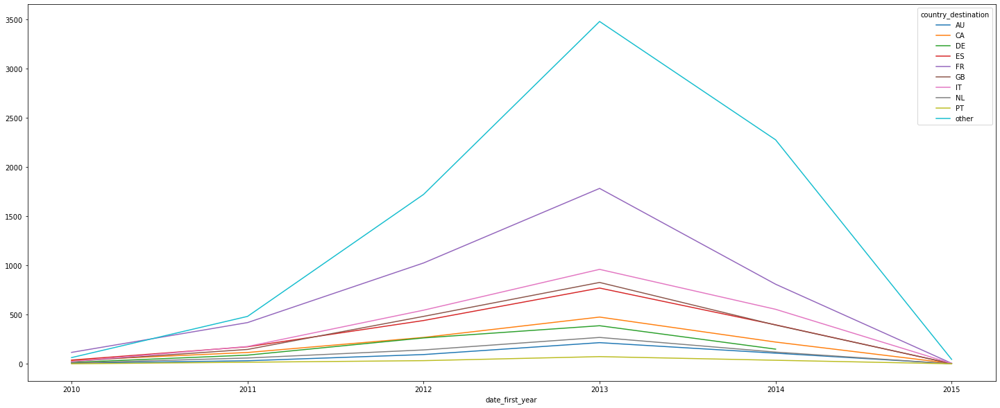

In [98]:
(rest
 .groupby(['date_first_year', 'country_destination'])
 .size()
 .unstack()
 .plot(figsize=(25, 10))
)

There is a common trend that against years, bookings increase till 2013 and decrease. But, year doesn't affect which country destination is chosen. Hence year from this feature can be dropped

In [99]:
train.drop(['date_first_year'], axis=1, inplace=True)

In [100]:
train['day_first_booking'] = train.date_first_booking.dt.dayofyear

In [101]:
test['day_first_booking'] = test.date_first_booking.dt.dayofyear

Mode of day of booking in a year vs country destination 

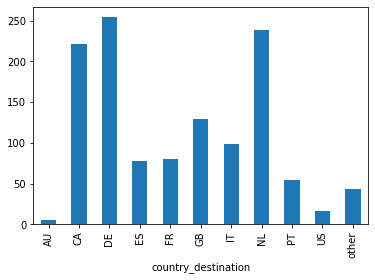

In [102]:
train[train.country_destination != "NDF"].groupby(["country_destination"]).day_first_booking.agg(lambda x: pd.Series.mode(x).iat[0]).plot.bar()

It seems better to use day of the year as the highest bookings for each country occur at different days in the year. The australian booking day might be lower coz it's summer at that time

#### Language

groupby country and language

In [106]:
# Converting the 2 level group into 1 level of rows and 1 level of columns
lang_ctr = train.groupby(["country_destination", "language"]).count().reset_index().pivot('country_destination', 'language').train.fillna(0)

English has way too high count, so lets plot english and the rest separately. We can drop NDF too for analysis 

In [108]:
ctrs = lang_ctr.drop('NDF')
eng_lang = ctrs[['en']]
other_lang = ctrs.drop("en", axis=1)

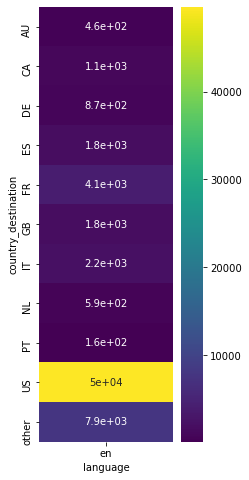

In [109]:
# from sklearn.preprocessing import StandardScaler
# lang_scaler = StandardScaler()
# eng_lang = lang_scaler.fit_transform(eng_lang)
plt.figure(figsize=(3, 8))
sns.heatmap(eng_lang, cmap="viridis", annot=True)

US has a lot of bookings, so let's view that country separately

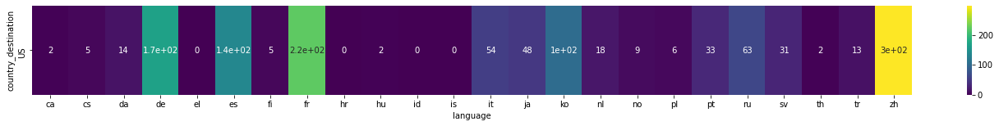

In [110]:
us_langs = other_lang.loc[['US'], :]
plt.figure(figsize=(24, 2))
sns.heatmap(us_langs, cmap="viridis", annot=True)

There are a lot of chinese bookings in the US

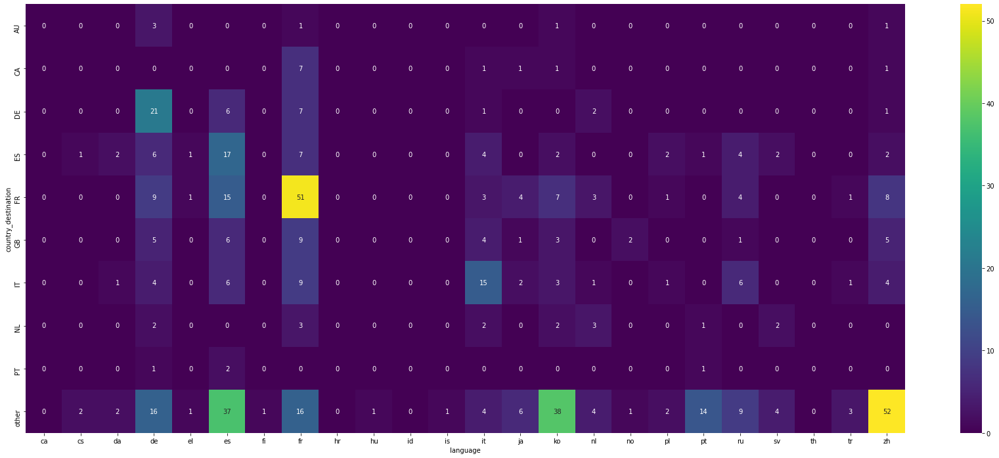

In [111]:
plt.figure(figsize=(30, 12))
sns.heatmap(other_lang.drop('US'), cmap="viridis", vmin=0, annot=True)

Language definitely helps is determining the country as seen from the above graph. 
* German language people book the most in Germany
* French language people book the most in France
* Italian language people book the most in Italy
* Spanish language people book the most in Spain, France and other countries(presumably Spanish as the official language)
* Korean language people book the most in other country(presumably Korea as it isn't in the list)
* Chinese language people book the most in other(presumably China as it isn't in the list)

# Pre Processing

ID can be dropped in both Test and Train categories

In [112]:
test_copy = test.copy()
train_copy = train.copy()
train.drop("id", axis=1, inplace=True)
test.drop("id", axis=1, inplace=True)

### Categorical Columns

Before one hot encoding the nominal categorical features, combine train and test data to identify all the categories of features mentioned above, which have too many categories for one hot encoding, i.e., language, affiliate provider, first browser

##### Language

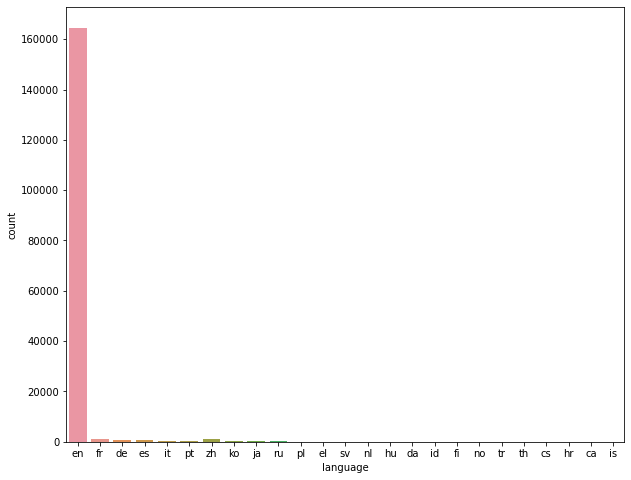

In [114]:
plt.figure(figsize=(10, 8))
sns.countplot(x="language", data=train)

In [115]:
tot = pd.concat([train, test], axis=0)

In [116]:
tot.language.value_counts()

en    206314
zh      1632
fr      1172
es       915
ko       747
de       732
it       514
ru       389
pt       240
ja       225
sv       122
nl        97
tr        64
da        58
pl        54
cs        32
no        30
el        24
th        24
id        22
hu        18
fi        14
ca         5
is         5
hr         2
Name: language, dtype: int64

In [117]:
train.country_destination.unique()

array(['NDF', 'US', 'other', 'FR', 'CA', 'GB', 'ES', 'IT', 'PT', 'NL',
       'DE', 'AU'], dtype=object)

We can group some of the languages into one where the language is European, and is not primarily spoken in any of the destination countries i.e., it is in other. This group has languages

* hr is Croatian
* ca is Catalan(Andorra's language)
* is is Iceland
* fi is Finnish
* hu is Hungarian
* el is Greek
* no is Norwegian
* cs is Czech
* pl is Polish
* da is Danish


So, the categories are now 15

In [118]:
train.language.unique()

array(['en', 'fr', 'de', 'es', 'it', 'pt', 'zh', 'ko', 'ja', 'ru', 'pl',
       'el', 'sv', 'nl', 'hu', 'da', 'id', 'fi', 'no', 'tr', 'th', 'cs',
       'hr', 'ca', 'is'], dtype=object)

In [119]:
eu_langs = ['hr', 'ca', 'is', 'fi', 'hu', 'el', 'no', 'cs', 'pl', 'da', 'tr', 'th', 'id', 'nl', 'sv']
train.language = train.language.apply(lambda x: 'eur' if x in eu_langs else x)
test.language = test.language.apply(lambda x: 'eur' if x in eu_langs else x)

In [120]:
train.language.value_counts()

en     164597
zh       1166
fr        957
es        742
de        624
ko        479
eur       461
it        449
ru        312
pt        194
ja        156
Name: language, dtype: int64

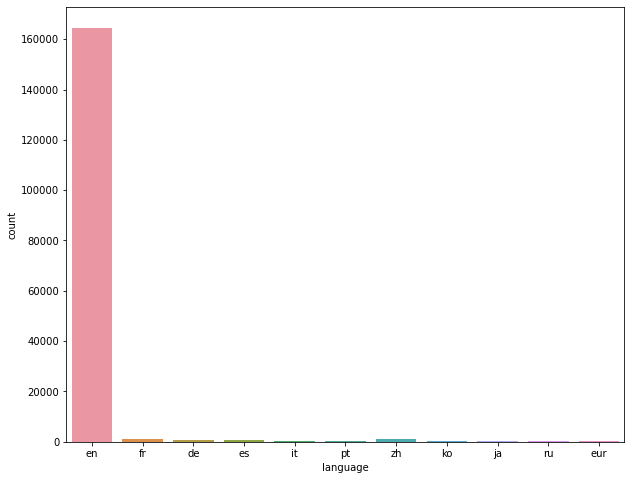

In [121]:
plt.figure(figsize=(10, 8))
sns.countplot(x="language", data=train)

In [122]:
tot = pd.concat([train, test], axis=0)

##### First Browser

In [123]:
# plt.figure(figsize=(15, 8))
px.histogram(tot, x="first_browser")

In [125]:
tot.first_browser.value_counts().index.tolist()[10:]

['Silk',
 'Chromium',
 'BlackBerry Browser',
 'Maxthon',
 'IE Mobile',
 'Apple Mail',
 'Sogou Explorer',
 'Mobile Firefox',
 'SiteKiosk',
 'RockMelt',
 'Iron',
 'IceWeasel',
 'Pale Moon',
 'SeaMonkey',
 'CometBird',
 'Yandex.Browser',
 'Camino',
 'TenFourFox',
 'wOSBrowser',
 'CoolNovo',
 'Avant Browser',
 'Opera Mini',
 'Mozilla',
 'Crazy Browser',
 'SlimBrowser',
 'OmniWeb',
 'Flock',
 'TheWorld Browser',
 'Opera Mobile',
 'Comodo Dragon',
 'Conkeror',
 'Google Earth',
 'Arora',
 'NetNewsWire',
 'Kindle Browser',
 'Epic',
 'IceDragon',
 'Stainless',
 'Outlook 2007',
 'PS Vita browser',
 'Googlebot',
 'Palm Pre web browser']

In [126]:
# Converting the 2 level group into 1 level of rows and 1 level of columns
brows = tot.groupby(["first_browser", "language"]).count().reset_index().pivot('language', 'first_browser').train.fillna(0)

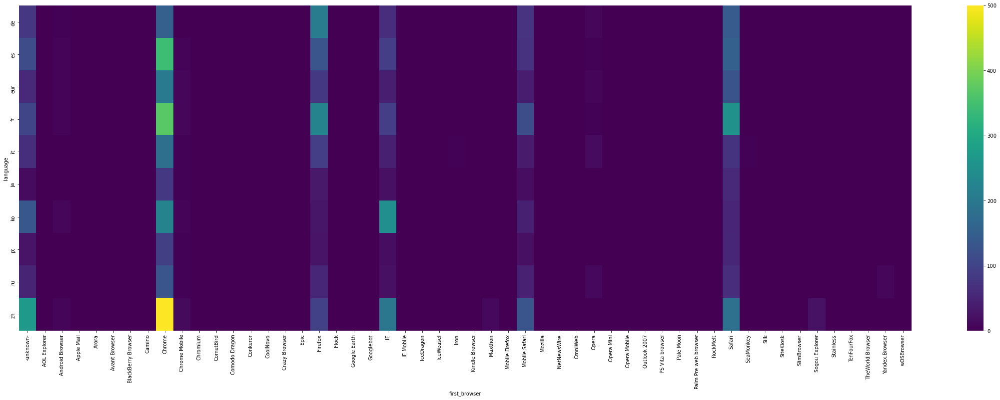

In [127]:
plt.figure(figsize=(40, 12))
sns.heatmap(brows.drop('en'), cmap="viridis", vmin=0, vmax=500)

There is no way of deciding browser through language. So just group the least count values

In [128]:
least_brows = tot.first_browser.value_counts().index.tolist()[6:]
train.first_browser = train.first_browser.apply(lambda x: 'other_browsers' if x in least_brows else x)
test.first_browser = test.first_browser.apply(lambda x: 'other_browsers' if x in least_brows else x)

In [129]:
px.histogram(pd.concat([train["first_browser"], test["first_browser"]]), x="first_browser")

##### Affiliate Provider

In [130]:
# plt.figure(figsize=(15, 8))
px.histogram(tot, x="affiliate_provider")

In [131]:
least_aff_prov = tot.affiliate_provider.value_counts().index.tolist()[-10:]
train.affiliate_provider = train.affiliate_provider.apply(lambda x: 'combined' if x in least_aff_prov else x)
test.affiliate_provider = test.affiliate_provider.apply(lambda x: 'combined' if x in least_aff_prov else x)

In [132]:
px.histogram(pd.concat([train["affiliate_provider"], test["affiliate_provider"]]), x="affiliate_provider")

##### Reflect to total 

In [133]:
tot = pd.concat([train, test], axis=0)

##### Dropping NDF 

Dropping all the NDF rows because whnever date_first_booking is NULL we have a NDF prediction.

In [136]:
ndf_rows = tot[tot.country_destination == "NDF"]
tot_country = tot.dropna(subset=['date_first_booking'])

In [137]:
test_total = tot.copy()

In [140]:
Y_train_test = tot_country[["country_destination", "train"]]
Y_train = Y_train_test[Y_train_test.train == 1].drop("train", axis=1)


In [141]:
tot_country.drop("country_destination", axis=1, inplace=True)

/opt/conda/lib/python3.7/site-packages/pandas/core/frame.py:4174: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



No NDF values are present


##### One hot features

Getting the index of all the object datatypes

In [143]:
otypes=tot_country.dtypes[tot_country.dtypes=="object"].index


In [144]:
dummy = pd.get_dummies(tot_country[otypes], drop_first=True)
total = pd.concat([tot_country.drop(otypes, axis=1), dummy], axis=1)

In [145]:
dummy_test = pd.get_dummies(test_total[otypes], drop_first=True)
test_total = pd.concat([test_total.drop(otypes, axis=1), dummy_test], axis=1)

date_first_booking is being represented through day_first_booking as days from 0-366. So, we can drop date_first_booking. Year cannot be used in the model as we want the model to predict for future years as well

In [146]:
total.drop("date_first_booking", axis=1, inplace=True)

In [147]:
test_total.drop("date_first_booking", axis=1, inplace=True)

Cyclic encoding the day_first_booking feature 

In [148]:
total['sin_day'] = np.sin(2*np.pi*total.day_first_booking/366)
total['cos_day'] = np.cos(2*np.pi*total.day_first_booking/366)

In [149]:

total.drop('day_first_booking', axis=1, inplace=True)

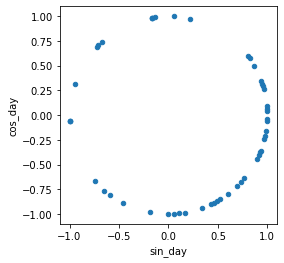

In [150]:
total.sample(50).plot.scatter('sin_day','cos_day').set_aspect('equal')

Test train separation

In [151]:
X_train = total[total.train == 1]
X_test = total[total.train == 0]

In [152]:
X_train.drop("train", axis=1, inplace=True)
X_test.drop("train", axis=1, inplace=True)

/opt/conda/lib/python3.7/site-packages/pandas/core/frame.py:4174: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [154]:
from sklearn.preprocessing import StandardScaler
scaler_tr = StandardScaler()
scaler_ts = StandardScaler()
X_train = scaler_tr.fit_transform(X_train)
X_test = scaler_ts.fit_transform(X_test)

Using LAbel encoder to encode the country destinations.

In [156]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y = le.fit_transform(Y_train.country_destination.ravel())

get_top_countries to get the top n most probable countries

In [158]:
def get_top_countries(proba, n):
  top_idx = np.flip(np.argsort(ypr_prob)[:, -n:])
  return np.apply_along_axis(le.inverse_transform, 1, top_idx)

In [159]:
!pip install parfit


  Created wheel for parfit: filename=parfit-0.220-py3-none-any.whl size=8660 sha256=65c71dec5da3b77450659c8766dff8444fef08d016aa56b12d680d25f8abaa72
  Stored in directory: /root/.cache/pip/wheels/9a/3b/19/64addee68f796a7e7108c2658a8765d600753bc728e7beb55e
Successfully built parfit
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


# Choosing Model

Splitting the train data set into smaller train sets and validation sets to check validation score.

In [160]:
from sklearn.model_selection import train_test_split
xtr, xvl, ytr, yvl = train_test_split(X_train, y, stratify=y, random_state = 420)

to_csv function takes the model and returns the top 3 prediction countries in a .csv file

In [161]:
def to_csv(model, filename):

  null_test = test_copy[test_copy.date_first_booking.isna()]
  notnull_test = test_copy[test_copy.date_first_booking.notna()]

  null_test['country_destination'] = "NDF"
  notnull_test["country_destination"] = ''
  
  top_predictions = np.apply_along_axis(le.inverse_transform, 1, np.flip(np.argsort(model.predict_proba(X_test))[:, -3:]))

  notnull_test = notnull_test[['id', 'country_destination']]
  
  out_nonNDF = pd.DataFrame(np.repeat(notnull_test.values, 3, axis=0), columns=notnull_test.columns)
  out_nonNDF["country_destination"] = top_predictions.flatten()

  null_test = null_test[["id", "country_destination"]]
  
  out_ndf = pd.DataFrame(np.repeat(null_test.values, 3, axis=0), columns=null_test.columns)
  
  out = pd.concat([out_ndf, out_nonNDF])
  out.to_csv(filename+".csv", index=False)

 custom scoring metric functions.

In [162]:
from sklearn.metrics import ndcg_score
from sklearn.metrics import log_loss

def get_true_y(row, col, y_labels):
  indexed_y = np.ndarray(shape=(row, col))
  for i, val in enumerate(y_labels):
    indexed_y[i][val] = 1
  return indexed_y

def my_ndcg_score(ytrue, ypred, k=3):
  return ndcg_score(ypred, get_true_y(ytrue.shape[0], ypred.shape[1], ytrue), k)

def logloss(y_true, y_pred, eps=1e-15):
  true_y = get_true_y(y_true.shape[0], y_pred.shape[1], y_true)
  y_pred = np.clip(y_pred, eps, 1 - eps)
  return -(true_y * np.log(y_pred)).sum(axis=1).mean()

### Naive Bayes

In [164]:
from sklearn.naive_bayes import BernoulliNB
nb = BernoulliNB()
nb.fit(X_train, y)

BernoulliNB()

### Logistic Regression

In [166]:
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression(class_weight='balanced', n_jobs=-1, max_iter=200)
clf.fit(X_train, y)

LogisticRegression(class_weight='balanced', max_iter=200, n_jobs=-1)

### XG Boost

In [ ]:
from xgboost import XGBClassifier
params_1 = {
    "learning_rate": 0.1,
    "n_estimators": 120,
    "max_depth": 4,
    "min_child_weight": 4,
    "gamma": 0.2,
    "objective":  'multi:softprob',
    "nthread": -1,
    "reg_alpha":  0.6,
    "seed": 42,
    "n_jobs": -1,
    "silent": 0,
    "gpu_id" : 0,
    "tree_method" : 'gpu_hist'
}
xgb_1 = XGBClassifier(**params_1)
xgb_1.fit(xtr, ytr, eval_metric="mlogloss", eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:
from xgboost import XGBClassifier
params_2 = {
    "learning_rate": 0.03,
    "n_estimators": 300,
    "max_depth": 4,
    "min_child_weight": 4,
    "objective":  'multi:softprob',
    "nthread": -1,
    "reg_alpha":  0.6,
    "seed": 42,
    "n_jobs": -1,
    "silent": 0,
    "gpu_id" : 0,
    "tree_method" : 'gpu_hist'
}
xgb_2 = XGBClassifier(**params_2)
xgb_2.fit(xtr, ytr, eval_metric="mlogloss", eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:
from xgboost import XGBClassifier
params_3 = {
    "learning_rate": 0.1,
    "n_estimators": 100,
    "max_depth": 4,
    "min_child_weight": 4,
    "gamma": 0.2,
    "objective":  'multi:softprob',
    "nthread": -1,
    "reg_alpha":  0.6,
    "seed": 42,
    "n_jobs": -1,
    "silent": 0,
}
xgb_3 = XGBClassifier(**params_3)
xgb_3.fit(xtr, ytr, eval_metric="mlogloss", eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:
from xgboost import XGBClassifier
params_4 = {
    "learning_rate": 0.1,
    "n_estimators": 120,
    "max_depth": 3,
    "min_child_weight": 4,
    "gamma": 0.2,
    "objective":  'multi:softprob',
    "nthread": -1,
    "reg_alpha":  0.6,
    "seed": 42,
    "n_jobs": -1,
    "silent": 0,
}
xgb_4 = XGBClassifier(**params_4)
xgb_4.fit(xtr, ytr, eval_metric="mlogloss", eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:

from xgboost import XGBClassifier
params_5 = {
    "learning_rate": 0.1,
    "n_estimators": 120,
    "max_depth": 3,
    "min_child_weight": 3,
    "gamma": 0.2,
    "objective":  'multi:softprob',
    "nthread": -1,
    "reg_alpha":  0.6,
    "seed": 42,
    "n_jobs": -1,
    "silent": 0,
}
xgb_5 = XGBClassifier(**params_5)
xgb_5.fit(xtr, ytr, eval_metric="mlogloss", eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:

from xgboost import XGBClassifier
params_6 = {
    "learning_rate": 0.07,
    "n_estimators": 340,
    "max_depth": 2,
    "min_child_weight": 5,
    "gamma": 0.2,
    "objective":  'multi:softprob',
    "nthread": -1,
    "reg_alpha":  0.6,
    "seed": 42,
    "n_jobs": -1,
    "silent": 0,
    "gpu_id" : 0,
    "tree_method" : 'gpu_hist',
    "colsample_bytree": 0.5,
    "subsample": 0.5,

}
xgb_6 = XGBClassifier(**params_6)
xgb_6.fit(xtr, ytr, eval_metric="mlogloss", eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:

from xgboost import XGBClassifier
params_7 = {
    "learning_rate": 0.07,
    "n_estimators": 170,
    "max_depth": 3,
    "min_child_weight": 2,
    "gamma": 0.2,
    "objective":  'multi:softprob',
    "nthread": -1,
    "reg_alpha":  0.6,
    "seed": 42,
    "n_jobs": -1,
    "silent": 0,
    "colsample_bytree": 0.5,
    "subsample": 0.5,
    "gpu_id": 0,
    "tree_method": "gpu_hist"
}
xgb_7 = XGBClassifier(**params_7)
xgb_7.fit(xtr, ytr, eval_metric="mlogloss", eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:

from xgboost import XGBClassifier
params_mm = {
    "learning_rate": 0.07,
    "n_estimators": 160,
    "max_depth": 3,
    "min_child_weight": 2,
    "gamma": 0.2,
    "objective":  'multi:softprob',
    "nthread": -1,
    "reg_alpha":  0.6,
    "seed": 42,
    "n_jobs": -1,
    "silent": 0,
    "colsample_bytree": 0.5,
    "subsample": 0.5,
    "gpu_id": 0,
    "tree_method": "gpu_hist"
}
xgb_mm = XGBClassifier(**params_mm)
xgb_mm.fit(xtr, ytr, eval_metric="mlogloss", eval_set=[(xvl, yvl)])

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import log_loss
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
lst_accu_stratified = []

for train_index, test_index in skf.split(X_train, y):
    x_train_fold, x_test_fold = X_train[train_index], X_train[test_index]
    y_train_fold, y_test_fold = y[train_index], y[test_index]
    testxg = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                colsample_bynode=1, colsample_bytree=0.5, gamma=0, gpu_id=0,
                learning_rate=0.07, max_delta_step=0, max_depth=2,
                min_child_weight=5, n_estimators=250, n_jobs=-1,
                nthread=None, objective='multi:softprob', random_state=0,
                reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=42, silent=0,
                subsample=0.5, tree_method='gpu_hist', verbosity=1)
    testxg.fit(x_train_fold, y_train_fold, eval_metric="mlogloss", eval_set=[(x_test_fold, y_test_fold)])
    print(log_loss(y_test_fold, testxg.predict_proba(x_test_fold)))
    lst_accu_stratified.append(log_loss(y_test_fold, testxg.predict_proba(x_test_fold)))


### Model used for submission

In [ ]:

from xgboost import XGBClassifier
params_8 = {
    "learning_rate": 0.07,
    "n_estimators": 250,
    "max_depth": 2,
    "min_child_weight": 5,
    "gamma": 0.2,
    "objective":  'multi:softprob',
    "nthread": -1,
    "reg_alpha":  0.6,
    "seed": 42,
    "n_jobs": -1,
    "silent": 0,
    "gpu_id" : 0,
    "tree_method" : 'gpu_hist'
}
xgb_8_full = XGBClassifier(**params_8)
xgb_8_full.fit(X_train, y, eval_metric="mlogloss", eval_set=[(X_train, y)])

In [ ]:

from xgboost import XGBClassifier
params_9 = {
    "learning_rate": 0.07,
    "n_estimators": 260,
    "max_depth": 2,
    "min_child_weight": 5,
    "gamma": 0.2,
    "objective":  'multi:softprob',
    "nthread": -1,
    "reg_alpha":  0.6,
    "seed": 42,
    "n_jobs": -1,
    "silent": 0,
}
xgb_9 = XGBClassifier(**params_9)
xgb_9.fit(xtr, ytr, eval_metric="mlogloss", eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:

from xgboost import XGBClassifier
params_a = {
    "learning_rate": 0.06,
    "feature_fraction": 1,
    "bagging_fraction": 1,
    # "bagging_freq": 0,
    "n_estimators": 550,
    "max_depth": 2,
    "min_child_weight": 5,
    "gamma": 0.2,
    "objective":  'multi:softprob',
    "nthread": -1,
    "reg_alpha":  0.6,
    "seed": 42,
    "n_jobs": -1,
    "silent": 0,
    "gpu_id" : 0,
    "tree_method" : 'gpu_hist'
}
xgb_a = XGBClassifier(**params_a)
xgb_a.fit(xtr, ytr, eval_metric="mlogloss", eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:

params_a_full = {
    "learning_rate": 0.06,
    "feature_fraction": 1,
    "bagging_fraction": 1,
    # "bagging_freq": 0,
    "n_estimators": 298,
    "max_depth": 2,
    "min_child_weight": 5,
    "gamma": 0.2,
    "objective":  'multi:softprob',
    "nthread": -1,
    "reg_alpha":  0.6,
    "seed": 42,
    "n_jobs": -1,
    "silent": 0,
    "gpu_id" : 0,
    "tree_method" : 'gpu_hist'
}

xgb_a_full = XGBClassifier(**params_a_full)
xgb_a_full.fit(X_train, y, eval_metric="mlogloss", eval_set=[(X_train, y)])

### Feature Importance

In [167]:
import seaborn as sns

feat_imp = pd.DataFrame(data=xgb_8_full.feature_importances_, index=total[total.train == 1].drop(["train"], axis=1).columns, columns=["Feature Importance"])
feat_imp = feat_imp.sort_values(by="Feature Importance", ascending=False) * 100
plt.figure(figsize=(25, 10))
sns.barplot(x=feat_imp.index, y=feat_imp["Feature Importance"])
plt.xticks(rotation=90)

NameError: name 'xgb_8_full' is not defined

### Grid search



In [ ]:
from sklearn.model_selection import GridSearchCV


from xgboost import XGBClassifier
params_9 = {
    "learning_rate": 0.07,
    "n_estimators": 260,
    "max_depth": 2,
    "min_child_weight": 5,
    "gamma": 0.2,
    "objective":  'multi:softprob',
    "nthread": -1,
    "reg_alpha":  0.6,
    "seed": 42,
    "n_jobs": -1,
    "silent": 0,
    "gpu_id" : 0,
    "tree_method" : 'gpu_hist'
}
xgb_9 = XGBClassifier(**params_9)
xgb_9.fit(xtr, ytr, eval_metric="mlogloss", eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:
param_test1 = {
  # 'learning_rate': 0.07
  'max_depth':range(2,10,2),
  'min_child_weight':range(1,9,2)
}


gsearch1 = GridSearchCV(estimator = XGBClassifier(learning_rate= 0.07, n_estimators=400, max_depth=5,
              min_child_weight=1, gamma=0.2, objective= 'multi:softprob', seed=42,
              gpu_id=0, tree_method="gpu_hist", n_jobs=-1, reg_alpha=0.6, verbose=100),
            param_grid = param_test1, scoring='neg_log_loss', n_jobs=-1, iid=False, cv=4, verbose=100)


gsearch1.fit(X_train, y)
# gsearch1.grid_scores_, gsearch1.best_params_, gsearch1.best_score_

In [ ]:
xgb_grid_best = XGBClassifier(learning_rate= 0.07, n_estimators=250, max_depth=2,
              min_child_weight=1, gamma=0.2, objective= 'multi:softprob', seed=42,
              gpu_id=0, tree_method="gpu_hist", n_jobs=-1, reg_alpha=0.6, verbose=100)
xgb_grid_best.fit(X_train, y, eval_metric="mlogloss", eval_set=[(X_train, y)])

### Parfit

In [ ]:
#! ls ..//usr/local/lib/python3.6/dist-packages/parfit/score.py

In [ ]:
#log_loss(yvl, xgb_1.predict_proba(xvl)[:, 1])

In [ ]:
# params = {
#     "learning_rate": 0.07,
#     "n_estimators": 250,
#     "max_depth": 2,
#     "min_child_weight": 5,
#     "gamma": 0.2,
#     "objective":  'multi:softprob',
#     "nthread": -1,
#     "reg_alpha":  0.6,
#     "seed": 42,
#     "n_jobs": -1,
#     "silent": 0
# }
# # xgb_8_full = XGBClassifier(**params_8)
# # xgb_8_full.fit(X_train, y, eval_metric="mlogloss", eval_set=[(X_train, y)])

In [ ]:
# from sklearn.model_selection import ParameterGrid
# import parfit.parfit as pf
# grid = {
#     "learning_rate": [0.07],
#     "n_estimators": [350],
#     "max_depth": [2, 4, 6],
#     "min_child_weight": [1, 2, 3, 4, 5, 6, 7, 8, 9],
#     "gamma": [0.2],
#     "objective":  ['multi:softprob'],
#     "nthread": [-1],
#     "reg_alpha":  [0.6],
#     "seed": [42],
#     "n_jobs": [-1],
#     "silent": [0],
#     "gpu_id" : [0],
#     "tree_method" : ['gpu_hist']
# }
# paramGrid = ParameterGrid(grid)


# import time

# start = time.time()

# bestXGModel, bestXGScore, allXGModels, allXGScores = pf.bestFit(XGBClassifier, paramGrid,
#            xtr, ytr, xvl, yvl,
#            metric = log_loss, predict_proba=True,
#            scoreLabel = "log_loss", n_jobs = -1)

# print(bestXGModel, bestXGScore)
# end = time.time()
# print("TIME: ", end - start)


In [ ]:
# # xgb_1.get_booster().best_iteration
# bst = xgb_1.get_booster() 
# xgb_1.predict_proba(xvl, ntree_limit=bst.best_ntree_limit)
# # xgb_1.get_num_boosting_rounds

In [ ]:
#xgb_1.get_booster()

In [ ]:
# bestest_scores_even = list(map(lambda x: log_loss(yvl, x.predict_proba(xvl, ntree_limit=x.get_booster().best_ntree_limit)), allXGModels))
# all_models_even = list(zip(bestest_scores_even, allXGModels))
# all_models_even.sort()
# all_models_even[0:2]

In [ ]:
#  best_even = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
#                 colsample_bynode=1, colsample_bytree=1, gamma=0.2, gpu_id=0,
#                 learning_rate=0.07, max_delta_step=0, max_depth=2,
#                 min_child_weight=6, missing=nan, n_estimators=350, n_jobs=-1,
#                 nthread=-1, objective='multi:softprob', random_state=0,
#                 reg_alpha=0.6, reg_lambda=1, scale_pos_weight=1, seed=42,
#                 silent=0, subsample=1, tree_method='gpu_hist', verbosity=1)
#  best_even.fit()

In [ ]:
# from sklearn.model_selection import ParameterGrid
# import parfit.parfit as pf
# grid = {
#     "learning_rate": [0.07],
#     "n_estimators": [350],
#     "max_depth": [1, 3, 5],
#     "min_child_weight": [1, 2, 3, 4, 5, 6, 7, 8, 9],
#     "gamma": [0.2],
#     "objective":  ['multi:softprob'],
#     "nthread": [-1],
#     "reg_alpha":  [0.6],
#     "seed": [42],
#     "n_jobs": [-1],
#     "silent": [0],
#     "gpu_id" : [0],
#     "tree_method" : ['gpu_hist']
# }
# paramGrid = ParameterGrid(grid)


# import time

# start = time.time()

# bestXGModelO, bestXGScoreO, allXGModelsO, allXGScoresO = pf.bestFit(XGBClassifier, paramGrid,
#            xtr, ytr, xvl, yvl,
#            metric = log_loss, predict_proba=True,
#            scoreLabel = "log_loss", n_jobs = -1)

# print(bestXGModelO, bestXGScoreO)
# end = time.time()
# print("TIME: ", end - start)


In [ ]:
# bestest_scores_odd = list(map(lambda x: log_loss(yvl, x.predict_proba(xvl, ntree_limit=x.get_booster().best_ntree_limit)), allXGModelsO))
# all_models_odd = list(zip(bestest_scores_odd, allXGModelsO))
# all_models_odd.sort()
# all_models_odd

In [ ]:
# testmodel = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
#                 colsample_bynode=1, colsample_bytree=1, gamma=0.2, gpu_id=0,
#                 learning_rate=0.07, max_delta_step=0, max_depth=3,
#                 min_child_weight=2, n_estimators=350, n_jobs=-1,
#                 nthread=-1, objective='multi:softprob', random_state=0,
#                 reg_alpha=0.6, reg_lambda=1, scale_pos_weight=1, seed=42,
#                 silent=0, subsample=1, tree_method='gpu_hist', verbosity=1)
# testmodel.fit(xtr, ytr,  eval_metric="mlogloss", eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:
# from xgboost import XGBClassifier
# odd_best = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
#                 colsample_bynode=1, colsample_bytree=1, gamma=0.2, gpu_id=0,
#                 learning_rate=0.07, max_delta_step=0, max_depth=3,
#                 min_child_weight=2, n_estimators=157, n_jobs=-1,
#                 nthread=-1, objective='multi:softprob', random_state=0,
#                 reg_alpha=0.6, reg_lambda=1, scale_pos_weight=1, seed=42,
#                 silent=0, subsample=1, tree_method='gpu_hist', verbosity=1)
# odd_best.fit(X_train, y, eval_metric="mlogloss", eval_set=[(X_train, y)])

In [ ]:
# for index, bm in enumerate(all_models_even):
#   print("MODEL ", index, "\nPARAMS ", bm[1])
#   bm[1].fit(xtr, ytr,  eval_metric="mlogloss", eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:
# # nan = np.nan
# best_even = all_models_even[0][1]
# best_even.fit(xtr, ytr,  eval_metric="mlogloss", eval_set=[(xtr, ytr), (xvl, yvl)])

### Random forest

In [168]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

Used the below model in stacking

In [ ]:

rf_params_1 = {
    "n_estimators": 250,
    "max_features": 'sqrt',
    "max_depth": 9,
    # "min_samples_split": 2,
    # "min_samples_leaf": 2,
    "bootstrap": True
}
rf = RandomForestClassifier(**rf_params_1, verbose=10, n_jobs=-1)
rf.fit(xtr, ytr)

log_loss(yvl, rf.predict_proba(xvl))

In [ ]:
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
rf = RandomForestRegressor()
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

In [ ]:
rf_random.fit(X_train,y)

In [ ]:
my_ndcg_score(yvl, rf.predict_proba(xvl))

In [ ]:
param_grid = {
    'bootstrap': [True],
    'max_depth': [8,9,10,11],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [2,3,4],
    'n_estimators': [20, 25, 30]
}
rf = RandomForestClassifier()
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

In [ ]:
grid_search.fit(xtr,ytr)

In [ ]:
print(grid_search.best_params_)
best_grid = grid_search.best_estimator_
logloss(yvl, best_grid.predict_proba(xvl))


In [ ]:
param_grid = {
    'bootstrap': [True],
    'max_depth': 8,
    'max_features': 6,
    'min_samples_leaf': 5,
    'min_samples_split': 7,
    'n_estimators': 25
}
rf = RandomForestClassifier(**param_grid)
rf.fit(xtr,ytr)
logloss(yvl, rf.predict_proba(xvl))


### CatBoost/Stacking

In [ ]:
!pip install catboost

In [ ]:
!pip install lightgbm

In [ ]:
!pip install parfit

In [ ]:
from sklearn.model_selection import ParameterGrid
import parfit.parfit as pf
grid = {
    "learning_rate": [0.05],
    "n_estimators": [1000],
    "depth": [2, 3, 4, 5, 6, 7, 8, 9],
    "l2_leaf_reg":  [0.9],
    "task_type": ["GPU"],
    "devices": ['0:1']
}
paramGrid = ParameterGrid(grid)


import time

start = time.time()

bestCBCModel, bestCBCScore, allCBCModels, allCBCScores = pf.bestFit(CatBoostClassifier, paramGrid,
           X_train, y, 
           metric = log_loss, predict_proba=True, nfolds=5,
           scoreLabel = "log_loss", n_jobs=-1)

print(bestCBCModel, bestCBCScore)
end = time.time()
print("TIME: ", end - start)


In [ ]:
from catboost import CatBoostClassifier
# grid_params = {
#     "learning_rate": [0.01, 0.05, 0.1, 0.5, 1],
#     "depth":list(range(10)),
#     "l2_leaf_reg":[v/10 for v in list(range(10))],
# }
p1 = {
    "iterations": 1500,
    "learning_rate": 0.05,
    "depth": 3,
    "l2_leaf_reg":0.9,
    # "random_strength": 0,
    # "bagging_temperature": 0,
    # "max_leaves":0,
    # "min_data_in_leaf": 0,
    "task_type": "GPU",
    "devices": '0:1'

}
cbc_1 = CatBoostClassifier(**p1, eval_metric="MultiClass", loss_function="MultiClass", verbose=100 )
# cbc_1.fit(xtr, ytr, eval_set=[(xvl, yvl)])

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import log_loss
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
lst_accu_stratified = []

for train_index, test_index in skf.split(X_train, y):
    x_train_fold, x_test_fold = X_train[train_index], X_train[test_index]
    y_train_fold, y_test_fold = y[train_index], y[test_index]
    testcbc = CatBoostClassifier(**p1, eval_metric="MultiClass", loss_function="MultiClass", verbose=100)
    testcbc.fit(x_train_fold, y_train_fold, eval_set=[(x_test_fold, y_test_fold)])
    print(log_loss(y_test_fold, testcbc.predict_proba(x_test_fold)))
    lst_accu_stratified.append(log_loss(y_test_fold, testcbc.predict_proba(x_test_fold)))


In [ ]:
p2 = {
    "iterations": 400,
    "learning_rate": 0.05,
    "depth": 3,
    "l2_leaf_reg":0.9,
    # "random_strength": 0,
    # "bagging_temperature": 0,
    # "max_leaves":0,
    # "min_data_in_leaf": 0,
    "task_type": "GPU",
    "devices": '0:1'

}
cbc_final = CatBoostClassifier(**p2, eval_metric="MultiClass", loss_function="MultiClass", verbose=100)
cbc_final.fit(X_train, y, plot=True)

In [ ]:

from sklearn.ensemble import StackingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression

### Max Voting Classifier

In [ ]:
model = VotingClassifier(estimators=[('rf',rf),('xgb',xgb_8_full)],voting='soft')
model.fit(xtr, ytr)

In [ ]:
log_loss(yvl, model.predict_proba(xvl))

### Stacking

In [ ]:
stack = StackingClassifier(estimators=[('xgb',xgb_8_full), ('rf',rf)], final_estimator=LogisticRegression(),cv=5,n_jobs=-1)
stack.fit(X_train,y)

In [ ]:
stack = StackingClassifier(estimators=[('lgb',lgb_6_full),('xgb',xgb_8_full), ('rf',rf)], final_estimator=LogisticRegression(),cv=5,n_jobs=-1)
stack.fit(X_train,y)

In [ ]:
stack3 = StackingClassifier(estimators=[('lr',clf),('xgb',xgb_8_full), ('rf',rf)], final_estimator=LogisticRegression(),cv=5,n_jobs=-1)
stack3.fit(X_train,y)

In [ ]:
stack4 = StackingClassifier(estimators=[('lgb',lgb_6),('xgb',xgb_8_full)], final_estimator=LogisticRegression(),cv=5,n_jobs=-1)
stack4.fit(X_train,y)

In [ ]:
stack4 = StackingClassifier(estimators=[('rf',rf),('xgb',xgb_8_full)], final_estimator=LogisticRegression(),cv=10,n_jobs=-1)
stack4.fit(X_train,y)

In [ ]:
stack6 = StackingClassifier(estimators=[('xgb',xgb_8_full), ('rf',rf)], final_estimator=XGBClassifier(),cv=5,n_jobs=-1)
stack6.fit(X_train,y)

In [ ]:
def multiclass_log_loss(y_true, y_pred, eps=1e-15):
    """Multi class version of Logarithmic Loss metric.
    https://www.kaggle.com/wiki/MultiClassLogLoss

    idea from this post:
    http://www.kaggle.com/c/emc-data-science/forums/t/2149/is-anyone-noticing-difference-betwen-validation-and-leaderboard-error/12209#post12209

    Parameters
    ----------
    y_true : array, shape = [n_samples]
    y_pred : array, shape = [n_samples, n_classes]

    Returns
    -------
    loss : float
    """
    predictions = np.clip(y_pred, eps, 1 - eps)

    # normalize row sums to 1
    predictions /= predictions.sum(axis=1)[:, np.newaxis]

    actual = np.zeros(y_pred.shape)
    rows = actual.shape[0]
    actual[np.arange(rows), y_true.astype(int)] = 1
    vsota = np.sum(actual * np.log(predictions))
    return -1.0 / rows * vsota

In [ ]:
from sklearn.model_selection import StratifiedKFold, cross_val_score
k_fold = StratifiedKFold(n_splits=5, shuffle=True)
cb_models = []
for itr, ivl in k_fold.split(X_train, y):
  print(itr, ivl)
  x_train_fold, x_test_fold = X_train[itr], X_train[ivl]
  y_train_fold, y_test_fold = y[itr], y[ivl]
  cbp = {
    "iterations": 2400,
    "learning_rate": 0.03,
    "depth": 5,
    "l2_leaf_reg":0.9,
  }
  #cbc_p = CatBoostClassifier(**cbp, task_type="GPU", eval_metric="MultiClass", loss_function="MultiClass", verbose=500)
  #cbc_p.fit(x_train_fold, y_train_fold, eval_set=[(x_test_fold, y_test_fold)])
  
  #cb_models.append(cbc_p)


#cb_best_scores = list(map(lambda x: x.get_best_score()['validation']['MultiClass'], cb_models))
#print("max ", max(cb_best_scores), "\nmin ", min(cb_best_scores), "\navg ", sum(cb_best_scores)/len(cb_best_scores))

In [ ]:
cbc_full_p1 = CatBoostClassifier(**cbp, eval_metric="MultiClass", loss_function="MultiClass", verbose=100)
#cbc_full_p1.fit(X_train, y)

In [ ]:
model_final = StackingClassifier(estimators=[('xgb 8 full',xgb_8_full), ('xgb 6', xgb_6), ('xgb 7', xgb_7)], voting='soft')
model_final.fit(X_train, y)

In [ ]:
stack_final_678 = StackingClassifier(estimators=[('xgb 8 full',xgb_8_full), ('xgb 6', xgb_6), ('xgb 7', xgb_7)], verbose=10, final_estimator=LogisticRegression(), cv=5, n_jobs=-1)
stack_final_678.fit(X_train, y)

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
stack8 = StackingClassifier(estimators=[('xgb8',xgb_8_full), ('rf',rf)], verbose=10, final_estimator=LogisticRegression(), cv=5, n_jobs=-1)
stack8.fit(xtr, ytr)

In [ ]:
model = VotingClassifier(estimators=[('stack8',stack8),('xgb',xgb_8_full)], voting='soft')

In [ ]:
model.fit(X_train, y)

In [ ]:
stackmm = StackingClassifier(estimators=[('rf',rf), ('xgbmm', xgb_mm)], verbose=10, final_estimator=LogisticRegression(), cv=5, n_jobs=-1)
stackmm.fit(X_train, y)

In [ ]:
cbp = {
    "iterations": 400,
    "learning_rate": 0.05,
    "depth": 3,
    "l2_leaf_reg":0.9,
}
cbc_new_final = CatBoostClassifier(**cbp, eval_metric="MultiClass", loss_function="MultiClass", verbose=100)
stackc = StackingClassifier(estimators=[('cbc_final', cbc_new_final), ('xgb_8_full', xgb_8_full)], verbose=10, final_estimator=LogisticRegression(), cv=5, n_jobs=-1)
stackc.fit(X_train, y)

### LightGBM

In [ ]:
from lightgbm import LGBMClassifier
lparams_1 = {
  'boosting_type': 'gbdt',
  'objective': 'multiclass',
  'metric': 'multi_logloss',
  #  'num_leaves': 31,
  'learning_rate': 0.03,
  'feature_fraction': 0.9,
  'bagging_fraction': 0.8,
  'bagging_freq': 5,
  'verbose': 100,
  'n_estimators': 850,
  "max_depth": 2,
  "min_child_weight": 3,
  "gamma": 0.2,
  "nthread": -1,
  "reg_alpha":  0.6,
  "seed": 42,
  "n_jobs": -1,
  "silent": 0,
}
lgb_1 = LGBMClassifier(**lparams_1, eval_metric="multi_logloss")
lgb_1.fit(xtr, ytr,  eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:
# best from previous at 540
from lightgbm import LGBMClassifier
lparams_2 = {
  'boosting_type': 'gbdt',
  'objective': 'multiclass',
  'metric': 'multi_logloss',
  'learning_rate': 0.025,
  'feature_fraction': 0.9,
  'bagging_fraction': 0.8,
  'bagging_freq': 5,
  'verbose': 100,
  'n_estimators': 700,
  "max_depth": 2,
  "min_child_weight": 3,
  "gamma": 0.2,
  "nthread": -1,
  "reg_alpha":  0.6,
  "seed": 42,
  "n_jobs": -1,
  "silent": 0,
}
lgb_2 = LGBMClassifier(**lparams_2, eval_metric="multi_logloss")
lgb_2.fit(xtr, ytr,  eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:
# best from previous at 595
from lightgbm import LGBMClassifier
lparams_3 = {
  'boosting_type': 'gbdt',
  'objective': 'multiclass',
  'metric': 'multi_logloss',
  'learning_rate': 0.025,
  'feature_fraction': 0.7,
  'bagging_fraction': 0.8,
  'bagging_freq': 5,
  'verbose': 100,
  'n_estimators': 800,
  "max_depth": 2,
  "min_child_weight": 3,
  "gamma": 0.2,
  "nthread": -1,
  "reg_alpha":  0.6,
  "seed": 42,
  "n_jobs": -1,
  "silent": 0,
}
lgb_3 = LGBMClassifier(**lparams_3, eval_metric="multi_logloss")
lgb_3.fit(xtr, ytr,  eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:
# best from previous at 680
from lightgbm import LGBMClassifier
lparams_4 = {
  'boosting_type': 'gbdt',
  'objective': 'multiclass',
  'metric': 'multi_logloss',
  'learning_rate': 0.025,
  'feature_fraction': 0.7,
  'bagging_fraction': 0.7,
  'bagging_freq': 5,
  'verbose': 100,
  'n_estimators': 800,
  "max_depth": 2,
  "min_child_weight": 3,
  "gamma": 0.2,
  "nthread": -1,
  "reg_alpha":  0.6,
  "seed": 42,
  "n_jobs": -1,
  "silent": 0,
}
lgb_4 = LGBMClassifier(**lparams_4, eval_metric="multi_logloss")
lgb_4.fit(xtr, ytr,  eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:
# best from previous at 670
from lightgbm import LGBMClassifier
lparams_5 = {
  'boosting_type': 'gbdt',
  'objective': 'multiclass',
  'metric': 'multi_logloss',
  'learning_rate': 0.025,
  'feature_fraction': 0.7,
  'bagging_fraction': 0.72,
  'bagging_freq': 5,
  'verbose': 100,
  'n_estimators': 800,
  "max_depth": 2,
  "min_child_weight": 3,
  "gamma": 0.2,
  "nthread": -1,
  "reg_alpha":  0.6,
  "seed": 42,
  "n_jobs": -1,
  "silent": 0,
}
lgb_5 = LGBMClassifier(**lparams_5, eval_metric="multi_logloss")
lgb_5.fit(xtr, ytr,  eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:
lparams_5_full = {
  'boosting_type': 'gbdt',
  'objective': 'multiclass',
  'metric': 'multi_logloss',
  'learning_rate': 0.025,
  'feature_fraction': 0.7,
  'bagging_fraction': 0.72,
  'bagging_freq': 5,
  'verbose': 100,
  'n_estimators': 705,
  "max_depth": 2,
  "min_child_weight": 3,
  "gamma": 0.2,
  "nthread": -1,
  "reg_alpha":  0.6,
  "seed": 42,
  "n_jobs": -1,
  "silent": 0,
}
lgb_5_full = LGBMClassifier(**lparams_5_full, eval_metric="multi_logloss")
lgb_5_full.fit(X_train, y, eval_set=[(X_train, y)])

In [ ]:
# best from previous at 705
from lightgbm import LGBMClassifier
lparams_6 = {
  'boosting_type': 'gbdt',
  'objective': 'multiclass',
  'metric': 'multi_logloss',
  'learning_rate': 0.025,
  'feature_fraction': 0.7,
  'bagging_fraction': 0.725,
  'bagging_freq': 5,
  'verbose': 100,
  'n_estimators': 1000,
  "max_depth": 2,
  "min_child_weight": 5,
  "gamma": 0.2,
  "nthread": -1,
  "reg_alpha":  0.6,
  "seed": 42,
  "n_jobs": -1,
  "silent": 0,
}
lgb_6 = LGBMClassifier(**lparams_6, eval_metric="multi_logloss")
lgb_6.fit(xtr, ytr,  eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:
# best from previous at 705
from lightgbm import LGBMClassifier
lparams_7 = {
  'boosting_type': 'gbdt',
  'objective': 'multiclass',
  'metric': 'multi_logloss',
  'learning_rate': 0.025,
  'feature_fraction': 0.7,
  'bagging_fraction': 0.725,
  'bagging_freq': 5,
  'verbose': 100,
  'n_estimators': 1000,
  "max_depth": 2,
  "min_child_weight": 5,
  "gamma": 0.9,
  "nthread": -1,
  "reg_alpha":  0.6,
  "seed": 42,
  "n_jobs": -1,
  "silent": 0,
}
lgb_7 = LGBMClassifier(**lparams_7, eval_metric="multi_logloss")
lgb_7.fit(xtr, ytr,  eval_set=[(xtr, ytr), (xvl, yvl)])

In [ ]:
# best from previous at 705
from lightgbm import LGBMClassifier
lparams_6_full_underfit = {
  'boosting_type': 'gbdt',
  'objective': 'multiclass',
  'metric': 'multi_logloss',
  'learning_rate': 0.025,
  'feature_fraction': 0.7,
  'bagging_fraction': 0.725,
  'bagging_freq': 5,
  'verbose': 100,
  'n_estimators': 670,
  "max_depth": 2,
  "min_child_weight": 5,
  "gamma": 0.2,
  "nthread": -1,
  "reg_alpha":  0.6,
  "seed": 42,
  "n_jobs": -1,
  "silent": 0,
}
lgb_6_full = LGBMClassifier(**lparams_6_full_underfit, eval_metric="multi_logloss")
#lgb_6_full.fit(X_train, y, eval_set=[(X_train, y)])

### First model

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state=42)
rf.fit(X_train, y)

In [ ]:
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, f1_score, auc, recall_score, log_loss
import parfit.parfit as pf
grid = {
    "learning_rate": [0.03, 0.1], 
    "n_estimators": [50, 100, 200],
    "max_depth": [2, 4, 6],
    # "min_child_weight": [9],
    "gamma": [0.2],
    "objective":  ['multi:softprob'],
    "nthread": [-1],
    "reg_alpha":  [0.6],
    "seed": [42],
    "n_jobs": [-1],
    "silent": [0],
    # "eval_metric": ["mlogloss"]
}
paramGrid = ParameterGrid(grid)

bestXGModel, bestXGScore, allXGModels, allXGScores = pf.bestFit(XGBClassifier, paramGrid,
           xtr, ytr, nfolds=2,
           metric = log_loss,
           scoreLabel = "log_loss")

print(bestXGModel, bestXGScore)


In [ ]:
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, f1_score, auc, recall_score, log_loss
import parfit.parfit as pf
grid = {
    "learning_rate": 0.1, 
    "n_estimators": 50,
    "max_depth": 6,
    # "min_child_weight": 9,
    "gamma": 0.2,
    "objective":  'multi:softprob',
    "nthread": -1,
    "reg_alpha":  0.6,
    "seed": 42,
    "n_jobs": -1,
    "silent": 0,
    "eval_metric": "mlogloss"
}
trying = XGBClassifier(**grid)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dcf = DecisionTreeClassifier()
dcf.fit(X_train, y)

In [ ]:
model.fit(X_train, Y_train.country_destination.ravel())

In [ ]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state=42)

In [ ]:
ypred=classifier.fit(X_train, y)